# **Full TMDB Movies Dataset 2024 (1M Movies)**

**Dataset Description**

The **TMDb** (The Movie Database) is a comprehensive movie database that provides information about movies, including details like titles, ratings, release dates, revenue, genres, and much more.

This dataset contains a collection of 1,000,000 movies from the TMDB database, and it is daily updated.


Link [here](https://www.kaggle.com/datasets/asaniczka/tmdb-movies-dataset-2023-930k-movies/data).

**NOTE**: The project code is designed to allow constant analysis on updated data. However, the analyses conducted here are based on the version of the dataset from January 4, 2025. This means that any future changes or updates to the dataset (e.g., new movies or changes in genre classification) will not be reflected in the current analysis unless it is explicitly re-run with the updated dataset. To use the interested version of data, please follow the instruction explained in the **Download Data** section.



**Project Goals**
- **Clustering**: The main goal of this part of the project is to use clustering algorithms on movie data, particularly focusing on genres, to **explore and capture genre similarities**. By applying various clustering techniques (such as *k-means, fuzzy c-means*, and *hierarchical clustering*), the project aims to uncover patterns of co-occurrence or relationship structures between different genres, helping to identify clusters of similar genres that might not be immediately obvious based on conventional genre classification alone.
- **Topic Modeling**: The goal of this part of the project is to develop a **movie recommendation system** based on the **analysis of overview texts and topic modeling of keywords**. Specifically, topic modeling is used to identify the main themes from the movie keywords, while cosine similarity between movie overviews is employed to find semantically similar movies. This approach is then compared to a recommendation system based solely on cosine similarity of the movie overviews, to evaluate whether topic modeling has effectively captured the thematic essence of the movies.

## **Import Libraries**

Import main libraries, necessary for this project:

In [ ]:
import kagglehub
import os
import shutil
import pandas as pd
import re
import matplotlib.pyplot as plt
import matplotlib.cm as cm
import seaborn as sns
import numpy as np
from sentence_transformers import SentenceTransformer
from sklearn.manifold import TSNE
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score, davies_bouldin_score, adjusted_rand_score, log_loss, jaccard_score
import matplotlib.lines as mlines
import matplotlib.colors as mcolors
import networkx as nx
import scipy.cluster.hierarchy as sch
from kneed import KneeLocator
import skfuzzy as fuzz
from networkx.algorithms.community import modularity, greedy_modularity_communities
from wordcloud import WordCloud
from sklearn.feature_extraction.text import CountVectorizer, TfidfVectorizer
from sklearn.decomposition import LatentDirichletAllocation
from sklearn.metrics.pairwise import cosine_similarity
from gensim.models import CoherenceModel
from gensim.corpora.dictionary import Dictionary
import spacy
import matplotlib.ticker as ticker
import math
#from google.colab import drive

**Note**: If problems arise when installing `skfuzzy`, please use: `pip install -U scikit-fuzzy`

## **Download Data**

If the project runs in Google Colab environment, to enable access to files stored in Google Drive, the Drive must be mounted to the Colab environment. This process grants read and write permissions, making all files in Google Drive accessible under the `/content/drive` directory after authentication. Otherwise, ignore the following code-chunk.

In [ ]:
# Run to connect to your own Gdrive
#from google.colab import drive
#drive.mount('/content/drive')

To analyze the dataset, first download it from **Kaggle** using the `kagglehub` library. The required file is then selected from the downloaded files, copied to the working directory, and saved at a specified location for further analysis.

Downloading data from Kaggle in this way, allows to retrieve the **most updated version**! If it is necessary to use a **specific version of data**, follow the instruction displayed while the next code chunk is running.

In [ ]:
# Define the destination file path
destination = "movie_plots.csv"

# Check if the file already exists
if not os.path.exists(destination):
    print("File does not exist. Downloading the dataset...")

    # Download latest version
    path = kagglehub.dataset_download("asaniczka/tmdb-movies-dataset-2023-930k-movies")

    print("Path to dataset files:", path)

    # Select which dataset you want to analyze
    source_file = os.listdir(path)[0]  # Select the correct file from the list

    # Define the source path
    source = f"{path}/{source_file}"

    # Copy the file to your working directory
    shutil.copy(source, destination)

    print(f"File copied to: {destination}")
else:
    # Prompt user to confirm if they want to re-download the dataset
    response = input("The dataset has already been downloaded. If you want to download the new version, please digit 'Y' else 'N': ")

    if response.upper() == 'Y':
        print("Downloading the new version of the dataset...")

        # Download the latest version
        path = kagglehub.dataset_download("asaniczka/tmdb-movies-dataset-2023-930k-movies")

        print("Path to dataset files:", path)

        # Select the dataset
        source_file = os.listdir(path)[0]

        # Define source path
        source = f"{path}/{source_file}"

        # Copy the file to your working directory
        shutil.copy(source, destination)

        print(f"File copied to: {destination}")
    else:
        print("Using the existing dataset.")

Using the existing dataset.


## **Import Data**

The dataset is loaded into a `Pandas` DataFrame, allowing for efficient data manipulation and analysis. Once loaded, the contents of the dataset are displayed.

In [ ]:
destination = "movie_plots.csv"
data = pd.read_csv(destination)
data

,id,title,vote_average,vote_count,status,release_date,revenue,runtime,adult,backdrop_path,...,original_title,overview,popularity,poster_path,tagline,genres,production_companies,production_countries,spoken_languages,keywords
0,27205,Inception,8.364,34495,Released,2010-07-15,825532764,148,False,/8ZTVqvKDQ8emSGUEMjsS4yHAwrp.jpg,...,Inception,"Cobb, a skilled thief who commits corporate es...",83.952,/oYuLEt3zVCKq57qu2F8dT7NIa6f.jpg,Your mind is the scene of the crime.,"Action, Science Fiction, Adventure","Legendary Pictures, Syncopy, Warner Bros. Pict...","United Kingdom, United States of America","English, French, Japanese, Swahili","rescue, mission, dream, airplane, paris, franc..."
1,157336,Interstellar,8.417,32571,Released,2014-11-05,701729206,169,False,/pbrkL804c8yAv3zBZR4QPEafpAR.jpg,...,Interstellar,The adventures of a group of explorers who mak...,140.241,/gEU2QniE6E77NI6lCU6MxlNBvIx.jpg,Mankind was born on Earth. It was never meant ...,"Adventure, Drama, Science Fiction","Legendary Pictures, Syncopy, Lynda Obst Produc...","United Kingdom, United States of America",English,"rescue, future, spacecraft, race against time,..."
2,155,The Dark Knight,8.512,30619,Released,2008-07-16,1004558444,152,False,/nMKdUUepR0i5zn0y1T4CsSB5chy.jpg,...,The Dark Knight,Batman raises the stakes in his war on crime. ...,130.643,/qJ2tW6WMUDux911r6m7haRef0WH.jpg,Welcome to a world without rules.,"Drama, Action, Crime, Thriller","DC Comics, Legendary Pictures, Syncopy, Isobel...","United Kingdom, United States of America","English, Mandarin","joker, sadism, chaos, secret identity, crime f..."
3,19995,Avatar,7.573,29815,Released,2009-12-15,2923706026,162,False,/vL5LR6WdxWPjLPFRLe133jXWsh5.jpg,...,Avatar,"In the 22nd century, a paraplegic Marine is di...",79.932,/kyeqWdyUXW608qlYkRqosgbbJyK.jpg,Enter the world of Pandora.,"Action, Adventure, Fantasy, Science Fiction","Dune Entertainment, Lightstorm Entertainment, ...","United States of America, United Kingdom","English, Spanish","future, society, culture clash, space travel, ..."
4,24428,The Avengers,7.710,29166,Released,2012-04-25,1518815515,143,False,/9BBTo63ANSmhC4e6r62OJFuK2GL.jpg,...,The Avengers,When an unexpected enemy emerges and threatens...,98.082,/RYMX2wcKCBAr24UyPD7xwmjaTn.jpg,Some assembly required.,"Science Fiction, Action, Adventure",Marvel Studios,United States of America,"English, Hindi, Russian","new york city, superhero, shield, based on com..."
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1156436,742891,Satin Seduction,0.000,0,Released,1986-01-01,0,88,True,NaN,...,Satin Seduction,Taija Rae heads a hot cast,0.600,/hA4tq5CK6mZnOIbFsRH9XHGZg2d.jpg,NaN,NaN,NaN,NaN,NaN,NaN
1156437,742892,Die Stimme des Feuers,0.000,0,Released,2022-12-18,0,0,False,/x7pGtjSupPEszCQuzBl6lXn6ReI.jpg,...,Die Stimme des Feuers,NaN,0.600,/qjCnNYMKatmRqfv2myF7VGonaiW.jpg,NaN,"Fantasy, Drama, Mystery","Jugendfilmcamp Arendsee, A.N. pictures",Germany,"German, Latin","witch, magic, christianity, witch burning, fan..."
1156438,742893,Secret Desire,0.000,0,Released,1975-01-01,0,56,True,NaN,...,Secret Desire,A daughter is beaten and violated by a father ...,0.600,/UCmrig6U8aGc341lCnSrvIrNUL.jpg,"A Madman, Driven by Insane Fantasies, Fulfills...",Horror,NaN,NaN,NaN,NaN
1156439,742894,The Childhood Friend,0.000,0,Released,1974-06-27,0,70,False,NaN,...,The Childhood Friend,"On holiday, with his family, nothing to do and...",1.313,/hCM6yPRnXFtNWmpKzWh0q7WFTK6.jpg,NaN,"Romance, Drama, TV Movie",NaN,NaN,English,NaN


## **Overall Data Cleaning for Clustering Task**

It is crucial to analyze the presence of missing values and clean the data to ensure it is in the best possible form for text mining applications.

In [ ]:
# Print dataset's columns
data.columns

Index(['id', 'title', 'vote_average', 'vote_count', 'status', 'release_date',
       'revenue', 'runtime', 'adult', 'backdrop_path', 'budget', 'homepage',
       'imdb_id', 'original_language', 'original_title', 'overview',
       'popularity', 'poster_path', 'tagline', 'genres',
       'production_companies', 'production_countries', 'spoken_languages',
       'keywords'],
      dtype='object')

Now, it is necessary to check for the **presence of missing values** in key columns of the dataset, specifically in the `overview` and `genres` columns. Missing values, often represented as NaN, can affect the quality and completeness of the data, so it’s important to quantify them.

In [ ]:
# Print out NaN's percentage
nas_overview = round((data[data['overview'].isna()].shape[0] / data.shape[0])* 100,2)
nas_genres = round((data[data['genres'].isna()].shape[0] / data.shape[0])* 100,2)
print('Percentage of missing labels (overview):', nas_overview, '%.')
print('\nPercentage of missing labels (genres):', nas_genres, '%.')

Percentage of missing labels (overview): 20.53 %.

Percentage of missing labels (genres): 40.4 %.


Next, it’s essential to remove rows with missing values (NaN) in critical columns to ensure the analysis is conducted on a complete dataset. Although this may seem like a heavy operation, the large volume of data (over one million rows) still provides ample data for performing text mining tasks.

In [ ]:
# Remove rows with missing data
dataset = data[(data['genres'].isna() == False) & (data['overview'].isna() == False)]

In [ ]:
dataset

,id,title,vote_average,vote_count,status,release_date,revenue,runtime,adult,backdrop_path,...,original_title,overview,popularity,poster_path,tagline,genres,production_companies,production_countries,spoken_languages,keywords
0,27205,Inception,8.364,34495,Released,2010-07-15,825532764,148,False,/8ZTVqvKDQ8emSGUEMjsS4yHAwrp.jpg,...,Inception,"Cobb, a skilled thief who commits corporate es...",83.952,/oYuLEt3zVCKq57qu2F8dT7NIa6f.jpg,Your mind is the scene of the crime.,"Action, Science Fiction, Adventure","Legendary Pictures, Syncopy, Warner Bros. Pict...","United Kingdom, United States of America","English, French, Japanese, Swahili","rescue, mission, dream, airplane, paris, franc..."
1,157336,Interstellar,8.417,32571,Released,2014-11-05,701729206,169,False,/pbrkL804c8yAv3zBZR4QPEafpAR.jpg,...,Interstellar,The adventures of a group of explorers who mak...,140.241,/gEU2QniE6E77NI6lCU6MxlNBvIx.jpg,Mankind was born on Earth. It was never meant ...,"Adventure, Drama, Science Fiction","Legendary Pictures, Syncopy, Lynda Obst Produc...","United Kingdom, United States of America",English,"rescue, future, spacecraft, race against time,..."
2,155,The Dark Knight,8.512,30619,Released,2008-07-16,1004558444,152,False,/nMKdUUepR0i5zn0y1T4CsSB5chy.jpg,...,The Dark Knight,Batman raises the stakes in his war on crime. ...,130.643,/qJ2tW6WMUDux911r6m7haRef0WH.jpg,Welcome to a world without rules.,"Drama, Action, Crime, Thriller","DC Comics, Legendary Pictures, Syncopy, Isobel...","United Kingdom, United States of America","English, Mandarin","joker, sadism, chaos, secret identity, crime f..."
3,19995,Avatar,7.573,29815,Released,2009-12-15,2923706026,162,False,/vL5LR6WdxWPjLPFRLe133jXWsh5.jpg,...,Avatar,"In the 22nd century, a paraplegic Marine is di...",79.932,/kyeqWdyUXW608qlYkRqosgbbJyK.jpg,Enter the world of Pandora.,"Action, Adventure, Fantasy, Science Fiction","Dune Entertainment, Lightstorm Entertainment, ...","United States of America, United Kingdom","English, Spanish","future, society, culture clash, space travel, ..."
4,24428,The Avengers,7.710,29166,Released,2012-04-25,1518815515,143,False,/9BBTo63ANSmhC4e6r62OJFuK2GL.jpg,...,The Avengers,When an unexpected enemy emerges and threatens...,98.082,/RYMX2wcKCBAr24UyPD7xwmjaTn.jpg,Some assembly required.,"Science Fiction, Action, Adventure",Marvel Studios,United States of America,"English, Hindi, Russian","new york city, superhero, shield, based on com..."
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1156433,742888,Ejacula 2,0.000,0,Released,1992-01-01,0,88,True,NaN,...,Ejacula 2,Ejacula continues his search for a flawless vi...,0.600,/8j7GsFuQ7OEF6G63hoKfWXh6C70.jpg,NaN,"Fantasy, Horror",NaN,NaN,NaN,NaN
1156435,742890,Martina hinter den Bergen,0.000,0,Released,2020-06-01,0,7,False,NaN,...,Martina hinter den Bergen,Taina Lopez films her colleague Martina shooti...,0.600,/9YBqHaU992xux3BuE1NmeQdvxD6.jpg,NaN,Documentary,NaN,Switzerland,German,"making of, ski resort"
1156438,742893,Secret Desire,0.000,0,Released,1975-01-01,0,56,True,NaN,...,Secret Desire,A daughter is beaten and violated by a father ...,0.600,/UCmrig6U8aGc341lCnSrvIrNUL.jpg,"A Madman, Driven by Insane Fantasies, Fulfills...",Horror,NaN,NaN,NaN,NaN
1156439,742894,The Childhood Friend,0.000,0,Released,1974-06-27,0,70,False,NaN,...,The Childhood Friend,"On holiday, with his family, nothing to do and...",1.313,/hCM6yPRnXFtNWmpKzWh0q7WFTK6.jpg,NaN,"Romance, Drama, TV Movie",NaN,NaN,English,NaN


At this point, it is necessary to select the most relevant columns for the analysis. This step helps streamline the dataset, ensuring that only the essential information is included.

In [ ]:
subset = dataset[['overview', 'genres']]

### **Plot Cleaning**

Now, filter the data to include only rows where the length of the `overview` column exceeds 250 characters, and display the dimensions of the filtered dataset compared to the original. This decision was made to exclude movie plots that may be too short and not contain enough information to effectively perform the desired tasks.

In [ ]:
# Filter rows where 'overview'lenth is greater than 250
data250 = subset[subset['overview'].str.len() > 250]
data250.shape, subset.shape

((242611, 2), (574570, 2))

In [ ]:
# Example of movie plot
data250.overview[0]

'Cobb, a skilled thief who commits corporate espionage by infiltrating the subconscious of his targets is offered a chance to regain his old life as payment for a task considered to be impossible: "inception", the implantation of another person\'s idea into a target\'s subconscious.'

Remove duplicate rows from the filtered dataset and display the dimensions of the dataset after duplicates have been removed.

In [ ]:
# Remove duplicate rows
data250_nodup = data250.drop_duplicates()
data250_nodup.shape

(242144, 2)

Now, identify rows with duplicate values in the `overview` column but differing values in the `genres` column. Then, display the count of unique duplicated overviews with varying genre classifications.

In [ ]:
# Find duplicates on 'overview' column with different values in genres column
dup_over_nogenre = data250_nodup[data250_nodup.duplicated(subset='overview', keep=False)]

# Print results
print('Number of duplicated plots, with different genre classification:',
      len(list(set(dup_over_nogenre['overview']))))

Number of duplicated plots, with different genre classification: 139


There are few films repeated across multiple rows, each classified under different genres. Given that this represents an extremely small number compared to the vast amount of available data (over 200,000 movie plots), to avoid incorrectly assigning genres by improperly manipulating them, it is better to remove these cases directly.

In [ ]:
dataset_sub = data250_nodup[~data250_nodup.overview.isin(dup_over_nogenre.overview)]
dataset_sub.shape

(241857, 2)

### **Genre Analysis**

In [ ]:
dataset_sub.head()

,overview,genres
0,"Cobb, a skilled thief who commits corporate es...","Action, Science Fiction, Adventure"
2,Batman raises the stakes in his war on crime. ...,"Drama, Action, Crime, Thriller"
4,When an unexpected enemy emerges and threatens...,"Science Fiction, Action, Adventure"
5,The origin story of former Special Forces oper...,"Action, Adventure, Comedy"
6,As the Avengers and their allies have continue...,"Adventure, Action, Science Fiction"


Create an explicit copy of the DataFrame. Then, split the `genres` column into lists and create a unique set of all genres to check which genres the films are classified into.

In [ ]:
# Create a DataFrame copy
dataset_trasp = dataset_sub.copy()

# Split 'genres' in lists
dataset_trasp.loc[:, 'genres_split'] = dataset_trasp['genres'].str.split(", ")

# Create a unique set of single genres
unique_genres = set(genre for genres_list in dataset_trasp['genres_split'] for genre in genres_list)

In [ ]:
unique_genres

{'Action',
 'Adventure',
 'Animation',
 'Comedy',
 'Crime',
 'Documentary',
 'Drama',
 'Family',
 'Fantasy',
 'History',
 'Horror',
 'Music',
 'Mystery',
 'Romance',
 'Science Fiction',
 'TV Movie',
 'Thriller',
 'War',
 'Western'}

Since it's unsure how to interpret the genre `TV Movie`, remove it.

In [ ]:
# Transform text into lowercase characters and remove 'tv movie' genre
def process_genres(genres_list):
    return [genre.lower() for genre in genres_list if genre.lower() != "tv movie"]

# Apply the function tp 'genres_split' column
dataset_trasp['genres_split'] = dataset_trasp['genres_split'].apply(process_genres)
unique_genres2 = set(genre for genres_list in dataset_trasp['genres_split'] for genre in genres_list)
unique_genres2

{'action',
 'adventure',
 'animation',
 'comedy',
 'crime',
 'documentary',
 'drama',
 'family',
 'fantasy',
 'history',
 'horror',
 'music',
 'mystery',
 'romance',
 'science fiction',
 'thriller',
 'war',
 'western'}

Create binary columns for each unique genre, where each column will indicate whether a particular genre is present in the `genres_split` list. From this perspective, if a film were classified as `['comedy', 'romantic']`, all genre columns would be set to 0, except for the `comedy` and `romantic` columns, which would be set to 1.

In [ ]:
# Create genres binary columns
for genre in unique_genres2:
    dataset_trasp.loc[:, genre] = dataset_trasp['genres_split'].apply(lambda x: 1 if genre in x else 0)

# View results
dataset_trasp.head()

,overview,genres,genres_split,romance,music,comedy,action,science fiction,thriller,horror,...,adventure,war,history,drama,mystery,fantasy,family,western,documentary,crime
0,"Cobb, a skilled thief who commits corporate es...","Action, Science Fiction, Adventure","[action, science fiction, adventure]",0,0,0,1,1,0,0,...,1,0,0,0,0,0,0,0,0,0
2,Batman raises the stakes in his war on crime. ...,"Drama, Action, Crime, Thriller","[drama, action, crime, thriller]",0,0,0,1,0,1,0,...,0,0,0,1,0,0,0,0,0,1
4,When an unexpected enemy emerges and threatens...,"Science Fiction, Action, Adventure","[science fiction, action, adventure]",0,0,0,1,1,0,0,...,1,0,0,0,0,0,0,0,0,0
5,The origin story of former Special Forces oper...,"Action, Adventure, Comedy","[action, adventure, comedy]",0,0,1,1,0,0,0,...,1,0,0,0,0,0,0,0,0,0
6,As the Avengers and their allies have continue...,"Adventure, Action, Science Fiction","[adventure, action, science fiction]",0,0,0,1,1,0,0,...,1,0,0,0,0,0,0,0,0,0


In [ ]:
list(dataset_trasp.columns[3:])

['romance',
 'music',
 'comedy',
 'action',
 'science fiction',
 'thriller',
 'horror',
 'animation',
 'adventure',
 'war',
 'history',
 'drama',
 'mystery',
 'fantasy',
 'family',
 'western',
 'documentary',
 'crime']

Now, remove any movies that are not classified under any genre (all null genre columns).

In [ ]:
# Select genres columns
generi_da_controllare = list(dataset_trasp.columns[3:])

# Remove movies with no genre classification
dataset_clean = dataset_trasp.copy()
dataset_clean = dataset_trasp.loc[
    (dataset_trasp[generi_da_controllare] != 0).any(axis=1)
]

# Print results
dataset_clean

,overview,genres,genres_split,romance,music,comedy,action,science fiction,thriller,horror,...,adventure,war,history,drama,mystery,fantasy,family,western,documentary,crime
0,"Cobb, a skilled thief who commits corporate es...","Action, Science Fiction, Adventure","[action, science fiction, adventure]",0,0,0,1,1,0,0,...,1,0,0,0,0,0,0,0,0,0
2,Batman raises the stakes in his war on crime. ...,"Drama, Action, Crime, Thriller","[drama, action, crime, thriller]",0,0,0,1,0,1,0,...,0,0,0,1,0,0,0,0,0,1
4,When an unexpected enemy emerges and threatens...,"Science Fiction, Action, Adventure","[science fiction, action, adventure]",0,0,0,1,1,0,0,...,1,0,0,0,0,0,0,0,0,0
5,The origin story of former Special Forces oper...,"Action, Adventure, Comedy","[action, adventure, comedy]",0,0,1,1,0,0,0,...,1,0,0,0,0,0,0,0,0,0
6,As the Avengers and their allies have continue...,"Adventure, Action, Science Fiction","[adventure, action, science fiction]",0,0,0,1,1,0,0,...,1,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1156419,Bored with their seemingly routine lives in No...,Animation,[animation],0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1156421,"In a first-person nonfiction narrative, an art...",Documentary,[documentary],0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,1,0
1156423,A high school girl escapes from her village an...,Comedy,[comedy],0,0,1,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1156426,The back staircase is used for the building ow...,Drama,[drama],0,0,0,0,0,0,0,...,0,0,0,1,0,0,0,0,0,0


## **Clustering**

Given the large size of the dataset, it makes sense to analyze the length of the available texts and identify any that could potentially impact the performance of clustering models. The length classes will be classified in intervals for ease (e.g., a text with a length between 200 and 299 will be classified as ‘200’, one between 300 and 399 as ‘300’, and so on).

In [ ]:
# Classify in intervals the movie overview length
prova = dataset_clean.copy()
prova['overview_length_group'] = [
    (len(x) // 100) * 100 if len(x) < 1000 else 1000  # Intervals width: 100
    for x in prova['overview']
]

# View length distributions
prova['overview_length_group'].value_counts()

overview_length_group
300     71377
400     48420
200     43899
500     29781
600     19752
700     12821
800      8609
900      6900
1000       79
Name: count, dtype: int64

Since texts longer than `600` characters could significantly slow down the performance of the models, consider a subset, excluding movies with story length greater than or equal to this threshold.

In [ ]:
subset_clean = dataset_clean.copy()
subset_clean = subset_clean[subset_clean.overview.apply(lambda x: len(x) < 600)]
subset_clean.shape

(193477, 21)

Compare differences in genre distribution among original data and the new clean subset.

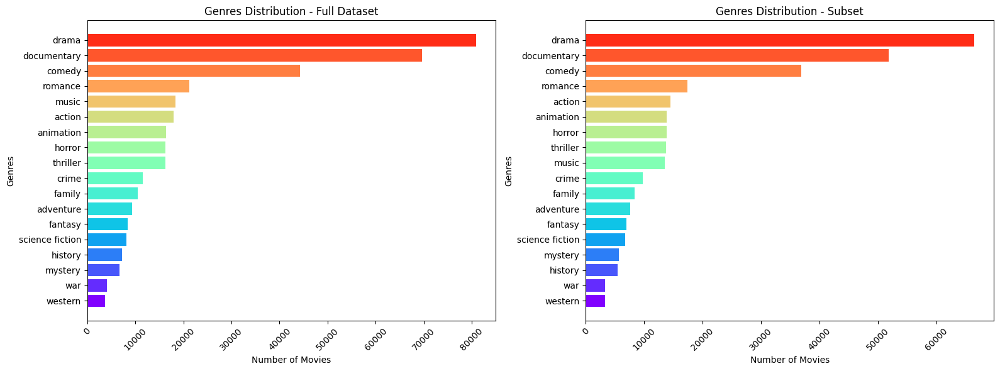

In [ ]:
# Select genre columns for both datasets
col_gen_clean = list(dataset_clean.columns[3:])
col_gen_subset = list(subset_clean.columns[3:])

# Sum values for each column
column_sums_clean = dataset_clean[col_gen_clean].sum().sort_values()
column_sums_subset = subset_clean[col_gen_subset].sum().sort_values()

# Genre rainbow colors
colors_clean = cm.rainbow([i / len(column_sums_clean) for i in range(len(column_sums_clean))])
colors_subset = cm.rainbow([i / len(column_sums_subset) for i in range(len(column_sums_subset))])

# Create the figure constisting of two subplots
fig, axes = plt.subplots(1, 2, figsize=(16, 6))

# dataset_clean
axes[0].barh(column_sums_clean.index, column_sums_clean.values, color=colors_clean)
axes[0].set_title('Genres Distribution - Full Dataset')
axes[0].set_xlabel('Number of Movies')
axes[0].set_ylabel('Genres')

# subset_clean -> (dataset with longer movie reviews dropped)
axes[1].barh(column_sums_subset.index, column_sums_subset.values, color=colors_subset)
axes[1].set_title('Genres Distribution - Subset')
axes[1].set_xlabel('Number of Movies')
axes[1].set_ylabel('Genres')

# Layout improvement
for ax in axes:
    ax.tick_params(axis='x', rotation=45)

plt.tight_layout()  # Avoid overlapping

# Show graphs
plt.show()

The only changes in the distribution were:
-	The number of `music` films has decreased significantly.
-	The number of `history` films has slightly decreased compared to `mystery` movies.

Aside from this, the distribution remained fairly homogeneous.

### **Embedding**

Let’s try analyzing the embeddings of a random sample of films from each genre and examine the distribution.

Firstly, compute the embeddings of the entire datset.

To perform clustering, it is necessary to first convert the textual data into numerical representations, or embeddings. In this step, use the pre-trained `all-MiniLM-L6-v2` model from the `sentence_transformers` library. The model is applied to the `overview` column in the `subset_clean` dataset, transforming each text into a dense vector.

In [ ]:
# Load pre-trained model to create embeddings
model_sbert = SentenceTransformer('all-MiniLM-L6-v2')

# Apply model on each overview
embeddings = model_sbert.encode(subset_clean['overview'].tolist(), show_progress_bar=True)

Batches:   0%|          | 0/6048 [00:00<?, ?it/s]

In [ ]:
len(embeddings), subset_clean.shape

(193477, (193477, 21))

Create also a dataframe containing plots embeddings.

In [ ]:
# Add embeddings to dataframe
embeddings_df = pd.DataFrame(embeddings)

# Check dimensions
print(embeddings_df.shape)

(193477, 384)


Finally, construct a comprehensive dataframe that combines the original data with their corresponding embeddings.

In [ ]:
# Reset indices to align properly
subset_clean_reset = subset_clean.reset_index(drop=True)
embeddings_df_reset = embeddings_df.reset_index(drop=True)

# Concatenate along columns (axis=1)
subset_clean_embeddings = pd.concat([subset_clean_reset, embeddings_df_reset], axis=1)

# Check the shape of the resulting DataFrame
print(subset_clean_embeddings.shape)

(193477, 405)


Since the embedding calculation process can be time-consuming, it may be beneficial to save the data for quicker retrieval in the future. However, it is crucial to note that if the data source is updated, the saved embeddings may no longer correspond to the latest version of the data.

In [ ]:
# Save embedding in a file .npy
# np.save('embeddings.npy', embeddings)

# Load embedding from file .npy
# embeddings = np.load('embeddings.npy')

### **Text Representation**

To examine the **distribution of data** and uncover underlying structure and patterns, a **random sampling approach** is employed due to the large dataset size and computational cost of dimensionality reduction algorithms like **t-SNE**.

Steps:  
1. **Per-Genre Sampling**: Extract a **random sample of 1000 movies** per genre to ensure manageable data size while maintaining representativeness.  
   
2. **Focus on One Genre at a Time**:  
   - Filter the data to include only movies where the specific genre column is set to `1`.  
   - Treat these samples as representative of a **single genre**, ignoring potential overlap with other genres.  

This method provides a practical compromise, enabling detailed exploration of genre-specific data distribution in reduced dimensional space.


In [ ]:
# Define the genre columns (from column 3 to 21)
genre_columns = subset_clean_embeddings.columns[3:21]

# Define the number of samples you want per genre
samples_per_genre = 1000

# Create an empty list to hold the sampled data
sampled_data = []

# Loop through each genre
for genre in genre_columns:
    # Get the subset of rows for the current genre (where the genre column is 1)
    genre_subset = subset_clean_embeddings[subset_clean_embeddings[genre] == 1]

    # Randomly sample 1000 observations if there are enough data points
    if len(genre_subset) >= samples_per_genre:
        sampled_genre = genre_subset.sample(n=samples_per_genre, random_state=42)
    else:
        sampled_genre = genre_subset  # If fewer than 1000, take all available

    # Add a new column to indicate the genre
    sampled_genre['genre'] = genre  # Aggiunge la colonna "genre" con il nome del genere

    # Append the sampled data to the list
    sampled_data.append(sampled_genre)

# Concatenate all the sampled data into a single DataFrame
sampled_data_df = pd.concat(sampled_data)

Applying **t-SNE** is important as it reduces the dimensionality of the embeddings. The algorithm performs a **nonlinear dimensionality reduction**, analyzing the data components and selecting the first two, which are then displayed on the x-y axis for visualization.

In [ ]:
# Extract embeddings (columns from 21 to 406)
embeddings_sub = sampled_data_df.iloc[:, 21:(-1)].values

# Apply dimensionality reduction with t-SNE
tsne = TSNE(n_components=2, random_state=42)
reduced_embeddings = tsne.fit_transform(embeddings_sub)

In [ ]:
reduced_df = pd.DataFrame(reduced_embeddings, columns=['tSNE_1', 'tSNE_2'])

# Create a unified subsampled dataframe with also t-SNE components
sampled_data_with_embeddings = pd.concat([sampled_data_df.reset_index(drop=True), reduced_df], axis=1)

In [ ]:
sampled_data_with_embeddings.head()

,overview,genres,genres_split,romance,music,comedy,action,science fiction,thriller,horror,...,377,378,379,380,381,382,383,genre,tSNE_1,tSNE_2
0,The story of the exquisite torture suffered by...,"Animation, Romance","[animation, romance]",1,0,0,0,0,0,0,...,0.079252,-0.082381,-0.006349,0.111220,0.045406,-0.058995,-0.000923,romance,-8.488810,34.710091
1,Trust is a funny thing. It seems like you alwa...,"Drama, Romance","[drama, romance]",1,0,0,0,0,0,0,...,0.052481,0.012239,-0.012196,-0.024753,-0.063238,-0.041562,-0.006004,romance,-47.218048,-18.875132
2,Tami Oldham and Richard Sharp couldn't anticip...,"Thriller, Romance, Adventure","[thriller, romance, adventure]",1,0,0,0,0,1,0,...,-0.017866,0.002490,0.006747,0.033247,-0.047761,-0.005975,-0.000421,romance,-32.196316,-87.273468
3,"Sam Goldbright, a successful studio executive,...",Romance,[romance],1,0,0,0,0,0,0,...,0.036781,-0.135812,-0.015292,0.127082,-0.049436,0.009895,-0.035062,romance,11.672500,6.313318
4,Bored with Bollywood movies but fascinated wit...,"Comedy, Romance","[comedy, romance]",1,0,1,0,0,0,0,...,0.018376,0.050983,0.002716,0.034627,0.013013,-0.059174,-0.046057,romance,41.772167,-23.357521


Visualize the distribution of movie genres using **t-SNE components**. First, assign a unique color to each genre, then generate a scatter plot where the movies' t-SNE components are plotted on the x and y axes. The colors of the points correspond to their genre.

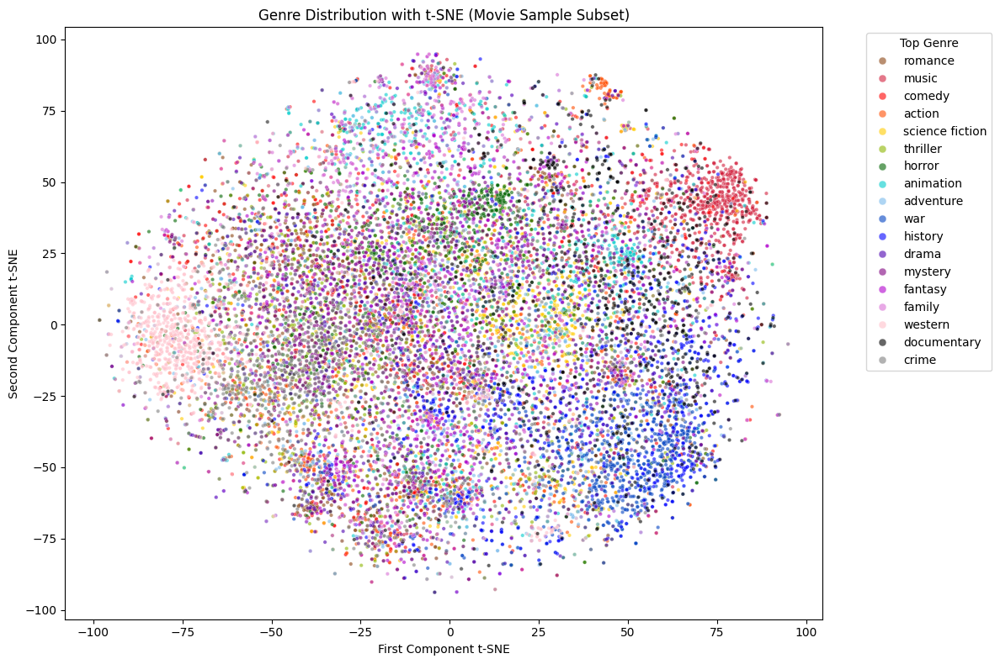

In [ ]:
# Create a manual palette
manual_palette = [
    '#8B4513', '#d21f3c', 'red', '#FF4D00', '#FFCC00', '#8db600',
    'darkgreen', '#00cccc', '#79baec', '#0041c2', 'blue', '#4c00b0',
    'purple', '#b100cd', '#DA70D6', 'pink', 'black', 'gray'
]

# Map colors to each genre
genre_colors = {genre: manual_palette[i] for i, genre in enumerate(sampled_data_df.columns[3:21])}

# Plot t-SNE components and color points according to genre
plt.figure(figsize=(12, 8))
sns.scatterplot(
    x='tSNE_1', y='tSNE_2', hue='genre', data=sampled_data_with_embeddings,
    palette=genre_colors, s=10, alpha=0.6  # Usa il mapping di colori
)

# Add title and legend
plt.title('Genre Distribution with t-SNE (Movie Sample Subset)')
plt.xlabel('First Component t-SNE')
plt.ylabel('Second Component t-SNE')

# Imposta la legenda con marker più grandi
plt.legend(title='Top Genre', bbox_to_anchor=(1.05, 1), loc='upper left', markerscale=2)

# Regola il layout
plt.tight_layout()

# Mostra il grafico
plt.show()

The distribution isn’t very clear. Let’s try to visualize each genre separately within the Cartesian plane to see if they form compact clusters or not.

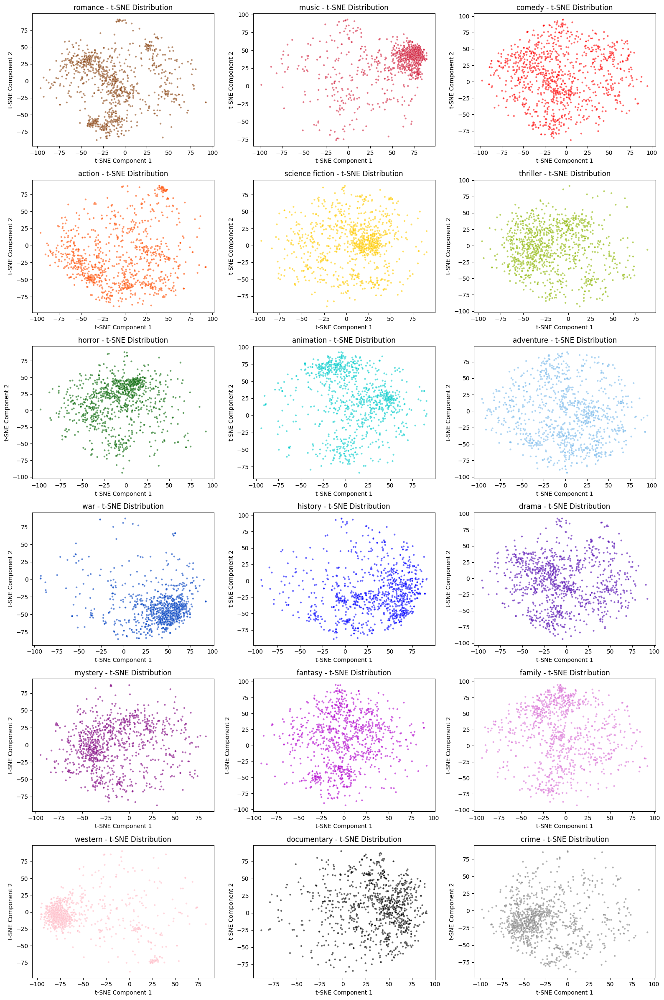

In [ ]:
# Visualize genre distribution
classes = sampled_data_with_embeddings['genre'].unique()

# Set window dimensions
n_cols = 3
n_rows = 6

# Create a figure with subplots
plt.figure(figsize=(16, 4 * n_rows))

# Create a loop for each genre class
for i, genre in enumerate(classes):
    # Select data
    class_data = sampled_data_with_embeddings[sampled_data_with_embeddings['genre'] == genre]

    # Create a new subplot for each genre
    plt.subplot(n_rows, n_cols, i + 1)
    sns.scatterplot(
        x='tSNE_1', y='tSNE_2', hue='genre', data=class_data,
        palette={genre: genre_colors[genre]}, s=10, alpha=0.6
    )
    plt.title(f'{genre} - t-SNE Distribution')
    plt.xlabel('t-SNE Component 1')
    plt.ylabel('t-SNE Component 2')

    # Hide legend
    plt.legend([], [], frameon=False)

# Adjust layout
plt.tight_layout()

# Show graphs
plt.show()

An additional analysis could focus on **intra-genre variance** to determine whether a genre is cohesive (compact) or exhibits significant variability. Interpretation of Results:
- **More compact genres**: A low value of `Intra_Genre_Variance` suggests that the data points within that genre are closer to each other, indicating higher internal consistency.
- **More dispersed genres**: A high value of `Intra_Genre_Variance` indicates greater dispersion of data points, reflecting lower internal cohesion.

In [ ]:
# Save intra-genres variance
intra_genre_variance = {}

# Loop on each genre
for genre in sampled_data_with_embeddings['genre'].unique():
    # Select data
    genre_subset = sampled_data_with_embeddings[sampled_data_with_embeddings['genre'] == genre]

    # Data matrix with t-SNE components
    X = genre_subset[['tSNE_1', 'tSNE_2']].values

    # Compute genre centroid
    centroid = X.mean(axis=0)

    # Compute sum of squared distances of each data point from the centroid
    variance = np.sum((X - centroid) ** 2)

    # Divide by the number of points to normalize
    normalized_variance = variance / len(X)
    intra_genre_variance[genre] = normalized_variance

# Create a dataframe with intra-genre variance
intra_genre_variance_df = pd.DataFrame.from_dict(intra_genre_variance, orient='index', columns=['Intra_Genre_Variance'])

# Sort data
intra_genre_variance_df = intra_genre_variance_df.sort_values(by='Intra_Genre_Variance')
print(intra_genre_variance_df)

                 Intra_Genre_Variance
war                        1540.39275
horror                     1971.81775
western                    2083.36925
music                      2111.64500
crime                      2150.68775
mystery                    2228.29850
science fiction            2258.47425
thriller                   2286.68400
documentary                2351.69300
history                    2572.46350
fantasy                    2669.90775
drama                      2720.17150
romance                    2775.65150
animation                  2893.83150
comedy                     3232.18100
adventure                  3275.72500
family                     3277.33725
action                     3579.63500


It can be observed that circular clusters correspond to less homogeneous groups, containing a variety of genres, particularly **adventure** and **comedy**. The more compact clusters appear to be **western, war**, and **music**. Slightly separated but less distinct are **crime, history,** and **documentary**.

In general, the distributions do not seem particularly compact, which could negatively impact the clustering process. Given this, an interesting next step could be to explore whether there are **groups of genres that tend to cluster together more closely** in the clusters that will be identified.

### **KMeans**

It is important to identify the **optimal number** of clusters for KMeans clustering using the **Elbow Method**. The following steps must be performed:

1. **Inertia Calculation**: The KMeans algorithm is applied for a range of cluster numbers (2 to 19), and the inertia (sum of squared distances to the nearest cluster center) is recorded for each configuration.
2. **Optimal Cluster Selection**: The `KneeLocator` library is used to determine the "elbow point," where the rate of decrease in inertia slows down, indicating the optimal number of clusters.
3. **Visualization**: The results are visualized through a plot, showing the inertia for each cluster number with the optimal cluster count marked using a vertical dashed line.


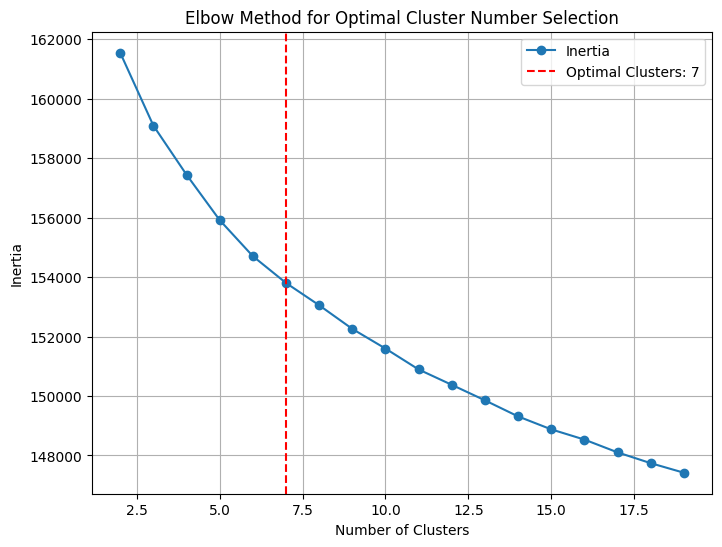

In [ ]:
# Calculate the inertia for different numbers of clusters
inertia = []
cluster_range = range(2, 20)  # Trying with 2 to 19 clusters

for n_clusters in cluster_range:
    kmeans = KMeans(n_clusters=n_clusters, random_state=42, n_init='auto')  # Ensure n_init is explicit
    kmeans.fit(embeddings)
    inertia.append(kmeans.inertia_)

# Use KneeLocator to find the optimal number of clusters
knee_locator = KneeLocator(cluster_range, inertia, curve="convex", direction="decreasing")
optimal_clusters = knee_locator.knee

# Display the elbow method plot with the optimal cluster marked
plt.figure(figsize=(8, 6))
plt.plot(cluster_range, inertia, marker='o', label='Inertia')
plt.axvline(x=optimal_clusters, color='red', linestyle='--', label=f'Optimal Clusters: {optimal_clusters}')
plt.title('Elbow Method for Optimal Cluster Number Selection')
plt.xlabel('Number of Clusters')
plt.ylabel('Inertia')
plt.legend()
plt.grid(True)
plt.show()

Apply the **KMeans clustering** to data using the previously identified optimal number of clusters. The **KMeans algorithm** is executed on the embedding dataset to assign each data point to a cluster.

In [ ]:
# Execute K-Means on embeddings
n_clusters = optimal_clusters
kmeans = KMeans(n_clusters=n_clusters, random_state=42)
subset_clean_embeddings['cluster_kmeans'] = kmeans.fit_predict(embeddings)

Try to evaluate the quality of the clustering results using two common key metrics:

1. **Silhouette Score**: Measures how similar data points are within the same cluster compared to those in other clusters. A higher score (close to 1) indicates well-separated and cohesive clusters, while a lower or negative score suggests overlapping or poorly defined clusters.

2. **Davies-Bouldin Index**: Evaluates the average similarity ratio of each cluster to its most similar cluster. A lower score indicates better clustering performance, with more distinct and compact clusters.

These metrics provide insights into the effectiveness of the clustering algorithm and help assess whether the clusters represent the data structure effectively.

In [ ]:
# Compute silhouette score
sil_score = silhouette_score(embeddings, subset_clean_embeddings['cluster_kmeans'])
print(f"Silhouette Score: {sil_score}")

# Compute Davies-Bouldin Index
db_index = davies_bouldin_score(embeddings, subset_clean_embeddings['cluster_kmeans'])
print(f"Davies-Bouldin Index: {db_index}")

Silhouette Score: 0.01775962859392166
Davies-Bouldin Index: 5.5412675385223675


Assess the alignment between the clustering results and the ground truth genres using the **Adjusted Rand Index (ARI)**. The ARI measures the similarity between the clusters and the true labels, accounting for chance. The process includes:

1. **Ground Truth Extraction**: For each genre column, the ground truth is defined as a binary label (1 if a movie belongs to the genre, 0 otherwise).
2. **ARI Calculation**: The ARI is computed for each genre, comparing the ground truth to the cluster assignments (`cluster_kmeans` column).
3. **Result Storage**: ARI values for all genres are stored in a list and converted into a DataFrame for easier analysis.

This step evaluates how well the clustering algorithm reflects the underlying genre structure in the dataset, in particular **ARI** assumes values ranging from -1 to 1:
-	`1`: Perfect agreement (clusterings are identical).
-	`0`: Random agreement (no better than chance).
-	`< 0`: Worse than random (systematic disagreement).

It accounts for chance groupings, making it more robust than the unadjusted Rand Index. Higher values indicate stronger alignment with the ground truth or between clusterings.

In [ ]:
# List of genre columns
genres_columns = subset_clean_embeddings.columns[3:21]

# Create an empty list to store the ARI values and their corresponding genres
ari_results = []

# Iterate through each genre
for genre in genres_columns:
    # Ground truth for the current genre (1 if the movie belongs to the genre, 0 otherwise)
    ground_truth = subset_clean_embeddings[genre]

    # Cluster IDs assigned by k-means (in 'cluster_kmeans' column)
    cluster_ids = subset_clean_embeddings['cluster_kmeans']

    # Compute Adjusted Rand Index (ARI)
    ari_score = adjusted_rand_score(ground_truth, cluster_ids)

    # Store the result in the list
    ari_results.append({"Genre": genre, "ARI": ari_score})

# Convert the list of ARI results into a DataFrame
ari_kmeans = pd.DataFrame(ari_results).sort_values('ARI', ascending=False)
ari_kmeans

,Genre,ARI
16,documentary,0.055766
1,music,0.023125
11,drama,0.019528
3,action,0.009472
17,crime,0.006139
2,comedy,0.004405
5,thriller,0.002931
7,animation,0.002325
8,adventure,0.001449
15,western,0.001196


The analysis reveals that the clustering outcomes are **entirely unsatisfactory**. None of the calculated indices indicate meaningful or robust results. This aligns with expectations set during the preliminary analysis, where several critical limitations of the data were identified:

1. **Genre Overlap**: The multilabel classification of films across multiple genres has led to significant overlap. This overlap diminishes the ability to distinctly separate data points into coherent clusters.

2. **Lack of Separation**: The overlapping nature of genres results in data points that are closely packed and broadly distributed throughout the embedding space. This lack of separation directly undermines the effectiveness of clustering.

Given these constraints, the current clustering approach fails to provide insightful or actionable results. It is evident that alternative methodologies must be explored.


**Data Visualization**

Visualize the data on a two-dimensional plane and analyze the distribution of genres within the clusters. This can help identify patterns, such as whether certain genres dominate specific clusters or if genres are evenly distributed across them, providing insights into the clustering results.

To plot data, use the **sample** extracted previously and its relative **dimensionality reduction of embedding** vectors (made with **t-SNE**).

In [ ]:
sampled_data_with_embeddings[['overview', 'genre', 'tSNE_1', 'tSNE_2']]

,overview,genre,tSNE_1,tSNE_2
0,The story of the exquisite torture suffered by...,romance,-8.488810,34.710091
1,Trust is a funny thing. It seems like you alwa...,romance,-47.218048,-18.875132
2,Tami Oldham and Richard Sharp couldn't anticip...,romance,-32.196316,-87.273468
3,"Sam Goldbright, a successful studio executive,...",romance,11.672500,6.313318
4,Bored with Bollywood movies but fascinated wit...,romance,41.772167,-23.357521
...,...,...,...,...
17995,Masao (Kokone Sasaki) was once famous for havi...,crime,0.504291,-49.537247
17996,Tommy takes up temporary housing in a New York...,crime,-64.625519,-54.087288
17997,"When debts are due, there's no where to hide a...",crime,-62.036533,-22.148447
17998,Kindergarten teacher Evgeniy Ivanovich Troshki...,crime,16.139574,-47.388336


In [ ]:
kmeans_df = pd.merge(subset_clean_embeddings[['overview','cluster_kmeans']],
             sampled_data_with_embeddings[['overview','genre','tSNE_1', 'tSNE_2']], on='overview')

In [ ]:
kmeans_df

,overview,cluster_kmeans,genre,tSNE_1,tSNE_2
0,Batman raises the stakes in his war on crime. ...,4,crime,22.289286,3.515220
1,"In Nazi-occupied France during World War II, a...",5,war,60.656147,-49.106400
2,Following the events of Captain America: Civil...,2,science fiction,19.263323,61.189472
3,"During World War II, Steve Rogers is a sickly ...",2,action,38.028664,-71.054619
4,With the world now aware of his dual life as t...,2,adventure,-59.575451,-8.871444
...,...,...,...,...,...
17995,Famed romantic filmmaker Frederick Curtis is s...,5,western,55.766247,34.852619
17996,Grace Brothers shut up shop over thirty years ...,0,comedy,59.566853,59.842621
17997,"“To be, or not to be..."" You probably know the...",5,music,79.295914,17.019619
17998,Thursday shot from filmmaker Galen Johnson's h...,5,documentary,36.387604,23.813265


To visualize the distribution of clusters within each genre, it is necessary to follow these steps:

1. **t-SNE Plotting**: For each genre, the subset of data belonging to that genre is visualized by applying t-SNE, reducing the dimensionality to two components (`tSNE_1` and `tSNE_2`).
2. **Cluster Visualization**: Each data point is plotted with a color corresponding to its assigned cluster, using a predefined custom color palette for clarity.

This visualization helps analyze how clusters are distributed across different genres and provides insights into cluster cohesion and separation.


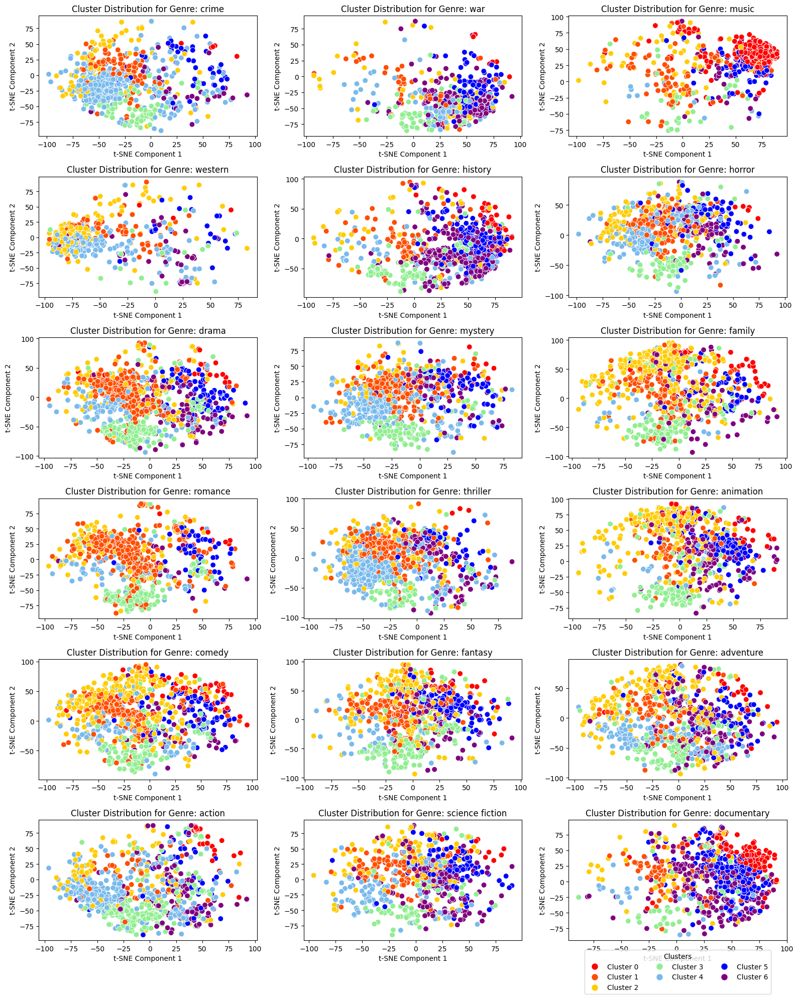

In [ ]:
# Assuming that kmeans_df and tsne are already defined
n_genres = len(kmeans_df['genre'].value_counts().index)

# Define the layout of the grid (6 rows, 3 columns)
n_cols = 3
n_rows = 6

# Create a figure with subplots arranged in 6x3 grid
plt.figure(figsize=(16, 20))

# Define the custom color palette for clusters
custom_palette = [
    'red', '#FF4D00', '#FFCC00', 'lightgreen',
    '#79baec', 'blue', 'purple', '#DA70D6'
]

# Loop through each genre and create a subplot for each
for i, genre in enumerate(kmeans_df['genre'].value_counts().index):  # Iterating over unique genres
    # Get the subset of data for the current genre
    genre_subset = kmeans_df[kmeans_df['genre'] == genre]

    # Perform t-SNE dimensionality reduction for the current genre subset
    reduced_genre_embeddings = genre_subset[['tSNE_1', 'tSNE_2']]  # Use tSNE columns directly

    # Create a subplot for the current genre (position calculated by i)
    plt.subplot(n_rows, n_cols, i + 1)

    # Plot the genre data with cluster colors (using the custom palette)
    sns.scatterplot(x=reduced_genre_embeddings['tSNE_1'], y=reduced_genre_embeddings['tSNE_2'], hue=genre_subset['cluster_kmeans'],
                    palette={j: custom_palette[j] for j in range(len(custom_palette))}, s=60, legend=None)

    # Add title and labels
    plt.title(f'Cluster Distribution for Genre: {genre}')
    plt.xlabel('t-SNE Component 1')
    plt.ylabel('t-SNE Component 2')

    # Hide the legend to avoid overlap
    plt.legend([], [], frameon=False)

# Add a color legend for the clusters at the bottom of the figure
# Get unique cluster labels from the DataFrame
unique_clusters = kmeans_df['cluster_kmeans'].unique()

# Create custom handles for the legend (one for each cluster label)
handles = [mlines.Line2D([], [], marker='o', color='w', markerfacecolor=custom_palette[i], markersize=10, label=f'Cluster {i}') for i in range(len(unique_clusters))]

# Add the legend below the plots
plt.legend(handles=handles, title='Clusters', bbox_to_anchor=(0.5, -0.05), loc='upper center', ncol=len(unique_clusters) // 2)

# Adjust layout to avoid overlap and improve the display
plt.tight_layout()

# Show the plot
plt.show()

The results of the clustering closely align with the initial expectations and previous index calculations. As anticipated, no **well-defined clusters** emerged, with data points often scattered **randomly** across the space. While certain **dense regions** of data points can be observed, they are typically too close to other clusters, preventing clear **separation**.

Analyzing each cluster, it emerges as follows:
- `Cluster 0 (Red)`: A highly concentrated zone for **documentary** and especially **music**, with **music** dominating this cluster.
- `Cluster 1 (Orange)`: A dense region for **drama** and **romance**, followed by **thriller**, **comedy**, and **crime** in lesser concentrations.
- `Cluster 2 (Yellow)`: Primarily features **comedy** and **family**, with **animation** being weaker and more dispersed in the cluster.
- `Cluster 3 (Cyan)`: Weakly represented across most genres, with few films present in the lower part of the graph. **Documentary**, **science fiction**, **war**, **western**, and **music** are notably sparse.
- `Cluster 4 (Blue)`: Genres such as **crime**, **mystery**, **thriller**, and **action** are more concentrated within this cluster, forming a somewhat cohesive group.
- `Cluster 5 (Dark Blue)`: Encompasses a variety of genres, including **documentary**, **science fiction**, **fantasy**, **animation**, **history**, and **war**. Documentary films are particularly dense in this region, while the other genres are more dispersed.
- `Cluster 6 (Purple)`: Similar to Cluster 3, **war**, **documentary**, and **history** are the main genres represented, though not tightly clustered.


These distributions further confirm the absence of strong cluster separations, indicating the need for **alternative analytical approaches** to better understand the data structure and improve clustering results.


Try to visualize all movies in a single plot.

/var/folders/w7/0xpq0vds7cz2333831nfq5dc0000gn/T/ipykernel_60549/4254806833.py:10: UserWarning: The palette list has more values (8) than needed (7), which may not be intended.
  sns.scatterplot(x=kmeans_df.tSNE_1, y=kmeans_df.tSNE_2, hue=kmeans_df['cluster_kmeans'], palette=custom_palette, s=60)


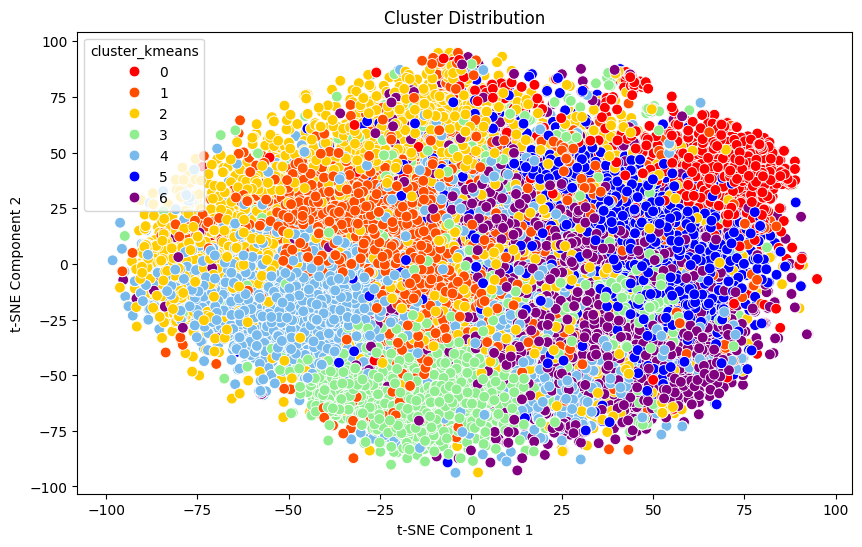

In [ ]:
# Define the custom color palette for clusters
custom_palette = [
    'red', '#FF4D00', '#FFCC00', 'lightgreen',
    '#79baec','blue', 'purple', '#DA70D6'
]

plt.figure(figsize=(10, 6))

# Create a scatter plot with custom colors
sns.scatterplot(x=kmeans_df.tSNE_1, y=kmeans_df.tSNE_2, hue=kmeans_df['cluster_kmeans'], palette=custom_palette, s=60)

# Add title and labels
plt.title('Cluster Distribution')
plt.xlabel('t-SNE Component 1')
plt.ylabel('t-SNE Component 2')

# Display the plot
plt.show()

It is clear that, although some clusters appear more compact, the **clusters are generally not well-separated**. This outcome is not surprising, as the preliminary analysis already highlighted the complexity of the problem. The limited separation of the data and the overlap between classes—given that a movie can belong to multiple genres—contribute to creating similarities across distinct genres.

At this point try a different approach: instead of analyze clusters, make a focus on genres distribution.

Visualize the **relative frequency distribution** of each **genre** within each cluster to assess how genres are distributed across different clusters. This analysis aims to evaluate potential genre combinations by observing clusters with overlapping or similar genres, which may indicate more closely related genres.


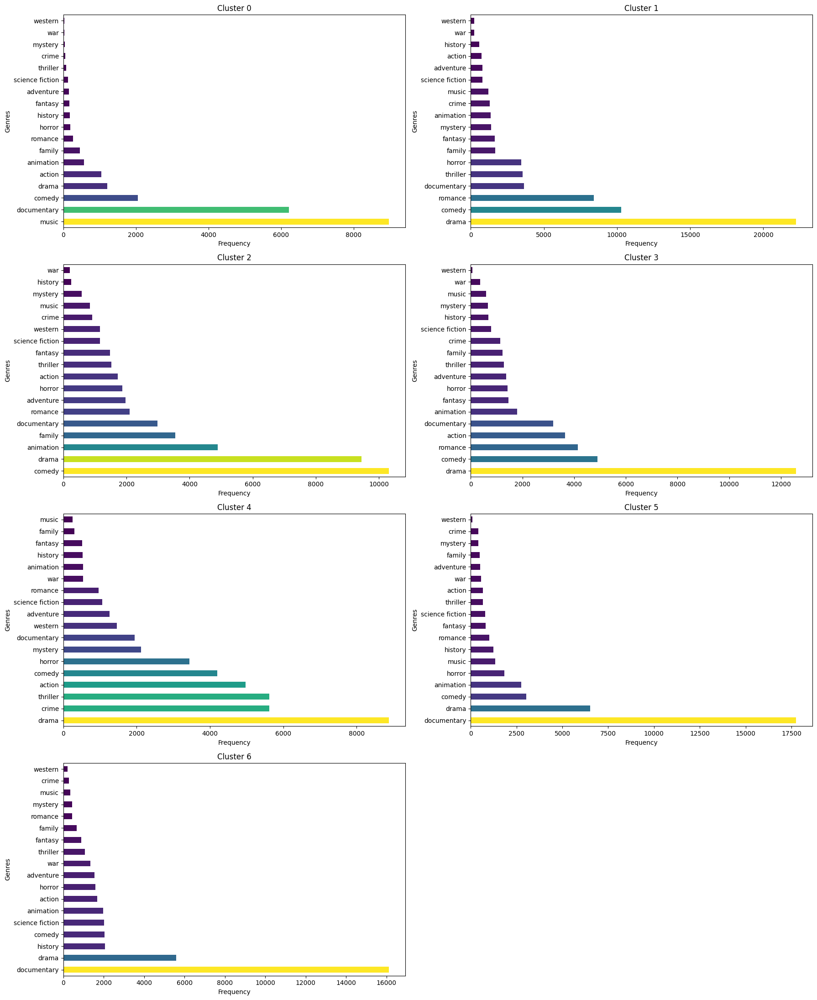

In [ ]:
# Contingency table for each cluster
contingency_table = subset_clean_embeddings.groupby('cluster_kmeans')[genre_columns].sum()

# Set the number of clusters to visualize
n_clusters = len(contingency_table)

# Set layout dimensions
n_rows = 4
n_cols = 2

# Create a subplots figure
plt.figure(figsize=(18, 22))

# Create a barplot for each cluster, where bars correspond to genre frequency
for i in range(n_clusters):
    plt.subplot(n_rows, n_cols, i + 1)
    cluster_data = contingency_table.iloc[i]  # Absolute frequencies

    # Sort genres by frequency
    cluster_data_sorted = cluster_data.sort_values(ascending=False)

    # Normalize vector to apply a color map
    norm = mcolors.Normalize(vmin=cluster_data_sorted.min(), vmax=cluster_data_sorted.max())
    cmap = plt.cm.viridis

    # Create the barplot
    cluster_data_sorted.plot(kind='barh', color=cmap(norm(cluster_data_sorted.values)), ax=plt.gca())

    # Add title and labels
    plt.title(f'Cluster {i}')
    plt.xlabel('Frequency')
    plt.ylabel('Genres')

# Improve visualization
plt.tight_layout()
plt.show()

In this step, the **absolute frequency distribution** of each genre within the clusters is analyzed to understand cluster composition and identify the most frequent genres in each cluster.

It is important to note that this analysis is limited due to the **severe imbalance** in genre representation. Predominant genres often dominate the clusters, not necessarily because they are representative of the cluster's characteristics, but because:
1. They are **highly heterogeneous** and **dispersed** across the embedding space.
2. They have a significantly higher number of observations compared to other genres.

This imbalance must be considered when interpreting the results, as the apparent dominance of a genre does not always reflect its true representativeness within a cluster. In fact, the graph does not appear particularly relevant or informative: in the top positions of each cluster, the same genres (**documentary, drama,** and **comedy**) are predominantly observed, sometimes combined with other genres that are less frequent. Therefore, the graph does not provide meaningful insights into the similarity between genres.


A valuable analysis to assess whether genres are evenly distributed across clusters or dominate specific ones and appear with other "more similar", involves examining the same plot while considering the **relative frequency of each genre** within a cluster, calculated as the absolute frequency of the genre divided by the total number of movies in that cluster.

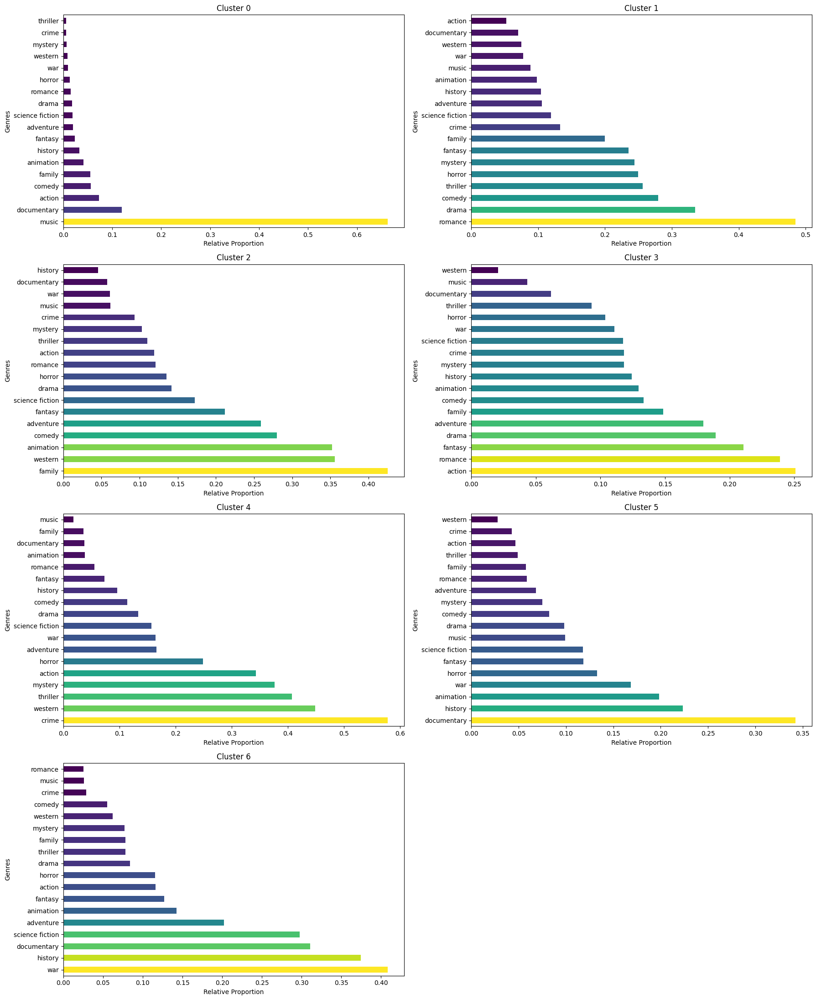

In [ ]:
# Contingency table for each cluster
contingency_table = subset_clean_embeddings.groupby('cluster_kmeans')[genre_columns].sum()

# Genre distribution on entire dataset
genre_counts_total = subset_clean[genre_columns].sum()

# Set the number of clusters found by the algorithm
n_clusters = len(contingency_table)

# Set layout dimensions
n_rows = 4
n_cols = 2

# Create a figure with subplots
plt.figure(figsize=(18, 22))

# Create a barplot for each cluster
for i in range(n_clusters):
    plt.subplot(n_rows, n_cols, i+1)  # Disposizione in 4 righe e 2 colonne
    cluster_data = contingency_table.iloc[i]

    # Compute relative proportion for each genre in the cluster (n. obs of the genre in the cluster / total n. obs of that genre)
    relative_proportions = cluster_data / genre_counts_total

    # Sort genres by relatives proportions
    relative_proportions_sorted = relative_proportions.sort_values(ascending=False)

    # Normalize value to create a color map
    norm = mcolors.Normalize(vmin=relative_proportions_sorted.min(), vmax=relative_proportions_sorted.max())
    cmap = plt.cm.viridis

    # Create graph
    relative_proportions_sorted.plot(kind='barh', color=cmap(norm(relative_proportions_sorted.values)), ax=plt.gca())

    # Add title and labels
    plt.title(f'Cluster {i}')
    plt.xlabel('Relative Proportion')
    plt.ylabel('Genres')

# Improve visualization
plt.tight_layout()
plt.show()

The following insights summarize the genre distribution within each cluster, highlighting key patterns and thematic concentrations:

1. **Cluster 0**: The individuality of the *music* genre stands out, with over 60% of films from this genre concentrated in this cluster. Other genres are almost entirely absent, indicating that *music* films are highly isolated and show little affinity with other genres.

2. **Cluster 1**: This cluster is dominated by *romance*, *drama*, and *comedy*. The latter two are among the most common genres in the dataset, suggesting that these films share overlapping characteristics. The grouping is logical, as romantic films often blend dramatic and comedic elements.

3. **Cluster 2**: Contains a notable mix of *family*, *western*, and *animation* films. The co-occurrence of *family* and *animation* is plausible, reflecting their frequent overlap in content.

4. **Cluster 3**: Exhibits a more diverse composition with smaller portions of various genres. While *romance*, *action*, and *fantasy* are present, the distributions show little variation, forming a heterogeneous cluster.

5. **Cluster 4**: A strong thematic focus is observed, with nearly 60% of films belonging to the *crime* genre. Additionally, around 40% are *western* or *thriller*, creating a tightly grouped thematic cluster.

6. **Cluster 5**: Shares proportional similarities with Cluster 2 but stands out for its higher concentration of *documentary* films (just under 35%). Secondary genres include *history* and *animation* at approximately 20%.

7. **Cluster 6**: Features a significant presence of *documentary*, *history*, *war*, and *science fiction* films. The cluster's composition appears logical, reflecting intuitive thematic groupings.

Making summarized considerations:
- **Genre Concentration**: Genres such as *music* and *crime* show strong thematic isolation, forming well-defined clusters.  
- **Prevalent Genres**: *Drama* and *comedy*, though widely distributed across clusters, lack discriminatory power due to their prevalence in the dataset.  
- **Diverse Clusters**: Clusters 3 and 5 contain a broader genre mix, indicating less thematic focus.  


The results demonstrate the varying degrees of thematic coherence within clusters. While some genres align strongly with specific clusters, others, like *drama* and *comedy*, are more dispersed. A deeper investigation into genre relationships and overlaps could further enhance understanding of the clusters' composition.


**Genre Correlation Analysis**

For the reasons listed up to this point, it may be worth **thinking outside the box**: since cluster analysis on individual movies proves less meaningful due to the model’s poor performance—clearly stemming from the limited separation in the initial data—a different approach could be considered. Instead of focusing on movies, the **analysis could shift to genres**, examining which ones might be more similar to each other, as done previously with the bar chart analysis by evaluating the proportions of genres within each cluster.

In [ ]:
keep_col_kmeans = list(subset_clean_embeddings.columns[3:21])
keep_col_kmeans.append('cluster_kmeans')
keep_col_kmeans

['romance',
 'music',
 'comedy',
 'action',
 'science fiction',
 'thriller',
 'horror',
 'animation',
 'adventure',
 'war',
 'history',
 'drama',
 'mystery',
 'fantasy',
 'family',
 'western',
 'documentary',
 'crime',
 'cluster_kmeans']

Analyze the composition of the clusters by computing the **relative frequency of each genre within them**, based on the total population of each cluster. This can be done by dividing the count of each genre in a cluster by the total number of movies in that cluster, providing a clear view of the genre distribution across clusters.

In [ ]:
# Group by cluster and sum genre columns
genre_distribution_kmeans = subset_clean_embeddings[keep_col_kmeans].groupby('cluster_kmeans').sum()

# Compute relative frequency of genres for each cluster
genre_frequency_kmeans = genre_distribution_kmeans.div(genre_distribution_kmeans.sum(axis=1), axis=0)

In [ ]:
genre_frequency_kmeans

,romance,music,comedy,action,science fiction,thriller,horror,animation,adventure,war,history,drama,mystery,fantasy,family,western,documentary,crime
cluster_kmeans,,,,,,,,,,,,,,,,,,
0,0.012135,0.410771,0.094244,0.048221,0.005770,0.003664,0.008609,0.025965,0.006777,0.001465,0.008197,0.055456,0.001832,0.007373,0.021065,0.001282,0.284563,0.002610
1,0.132568,0.018907,0.161998,0.011876,0.012741,0.055604,0.054330,0.021486,0.012646,0.003995,0.008997,0.349855,0.021707,0.025718,0.026190,0.003854,0.057192,0.020338
2,0.044842,0.017830,0.219649,0.036725,0.024860,0.032444,0.039857,0.104254,0.041987,0.004260,0.005347,0.201244,0.012355,0.031357,0.075538,0.024711,0.063417,0.019321
3,0.100297,0.014232,0.118612,0.087974,0.019233,0.031073,0.034600,0.043444,0.033030,0.008795,0.016503,0.304129,0.016116,0.035398,0.029937,0.001643,0.077271,0.027714
4,0.021826,0.005587,0.094882,0.112388,0.024088,0.126999,0.077873,0.012078,0.028589,0.012214,0.011965,0.200869,0.048063,0.011580,0.006785,0.033090,0.044105,0.127021
5,0.024834,0.032697,0.073891,0.016507,0.019511,0.016556,0.044906,0.067274,0.012673,0.013528,0.030011,0.159455,0.010329,0.020097,0.011721,0.002222,0.433678,0.010109
6,0.010897,0.008638,0.050786,0.041726,0.050041,0.026758,0.039665,0.049172,0.038201,0.033311,0.051183,0.138804,0.010773,0.021893,0.016134,0.005039,0.399955,0.007025


Analyze the **correlation between genres within the clusters** by calculating the correlation matrix of genre frequencies. For each genre, identify the top three most correlated genres by sorting the correlation values, excluding the current genre.

In [ ]:
# Genre correlation from relative frequencies
genre_correlation_kmeans = genre_frequency_kmeans.corr()

# Find the most correlated genres for each genre
for genre in genre_correlation_kmeans.columns:
    # Sort genres by correlation
    top_correlated = genre_correlation_kmeans[genre].drop(genre).sort_values(ascending=False).head(3)

    # Print results
    print(f"\nGenre: {genre}")
    for correlated_genre, correlation in top_correlated.items():
        print(f"  - Most correlated with: {correlated_genre} (correlation: {correlation:.2f})")


Genre: romance
  - Most correlated with: drama (correlation: 0.92)
  - Most correlated with: fantasy (correlation: 0.63)
  - Most correlated with: comedy (correlation: 0.51)

Genre: music
  - Most correlated with: documentary (correlation: 0.25)
  - Most correlated with: action (correlation: -0.07)
  - Most correlated with: family (correlation: -0.10)

Genre: comedy
  - Most correlated with: family (correlation: 0.87)
  - Most correlated with: fantasy (correlation: 0.52)
  - Most correlated with: romance (correlation: 0.51)

Genre: action
  - Most correlated with: crime (correlation: 0.77)
  - Most correlated with: mystery (correlation: 0.64)
  - Most correlated with: thriller (correlation: 0.61)

Genre: science fiction
  - Most correlated with: war (correlation: 0.92)
  - Most correlated with: history (correlation: 0.80)
  - Most correlated with: adventure (correlation: 0.72)

Genre: thriller
  - Most correlated with: mystery (correlation: 0.99)
  - Most correlated with: crime (corre

Save them into a dataframe.

In [ ]:
# Save most correlated genres
top_correlations_kmeans = []

for genre in genre_correlation_kmeans.columns:
    top_correlated_kmeans = genre_correlation_kmeans[genre].drop(genre).sort_values(ascending=False).head(3)
    for correlated_genre, correlation in top_correlated_kmeans.items():
        top_correlations_kmeans.append({'Genre': genre, 'Correlated Genre': correlated_genre, 'Correlation': correlation})

top_correlations_kmeans_df = pd.DataFrame(top_correlations_kmeans)
print(top_correlations_kmeans_df)

              Genre Correlated Genre  Correlation
0           romance            drama     0.924452
1           romance          fantasy     0.633790
2           romance           comedy     0.510172
3             music      documentary     0.252908
4             music           action    -0.071433
5             music           family    -0.103764
6            comedy           family     0.873292
7            comedy          fantasy     0.519499
8            comedy          romance     0.510172
9            action            crime     0.768772
10           action          mystery     0.635621
11           action         thriller     0.614844
12  science fiction              war     0.921280
13  science fiction          history     0.800467
14  science fiction        adventure     0.723104
15         thriller          mystery     0.992903
16         thriller            crime     0.956319
17         thriller           horror     0.891978
18           horror          mystery     0.906940


Create a graph to **visualize the genre correlations within the clusters** by adding nodes and edges based on the correlation values from the DataFrame. Each **edge** represents the **correlation between two genres**, with its **weight** corresponding to the **correlation** value. The graph is laid out using a customized spring layout, where node sizes are proportional to their degree, and edge thickness reflects the correlation strength. The plot also includes labels for each genre and a legend to illustrate the correlation thresholds represented by edge thickness, providing a clear visual representation of genre similarity in the KMeans clustering.

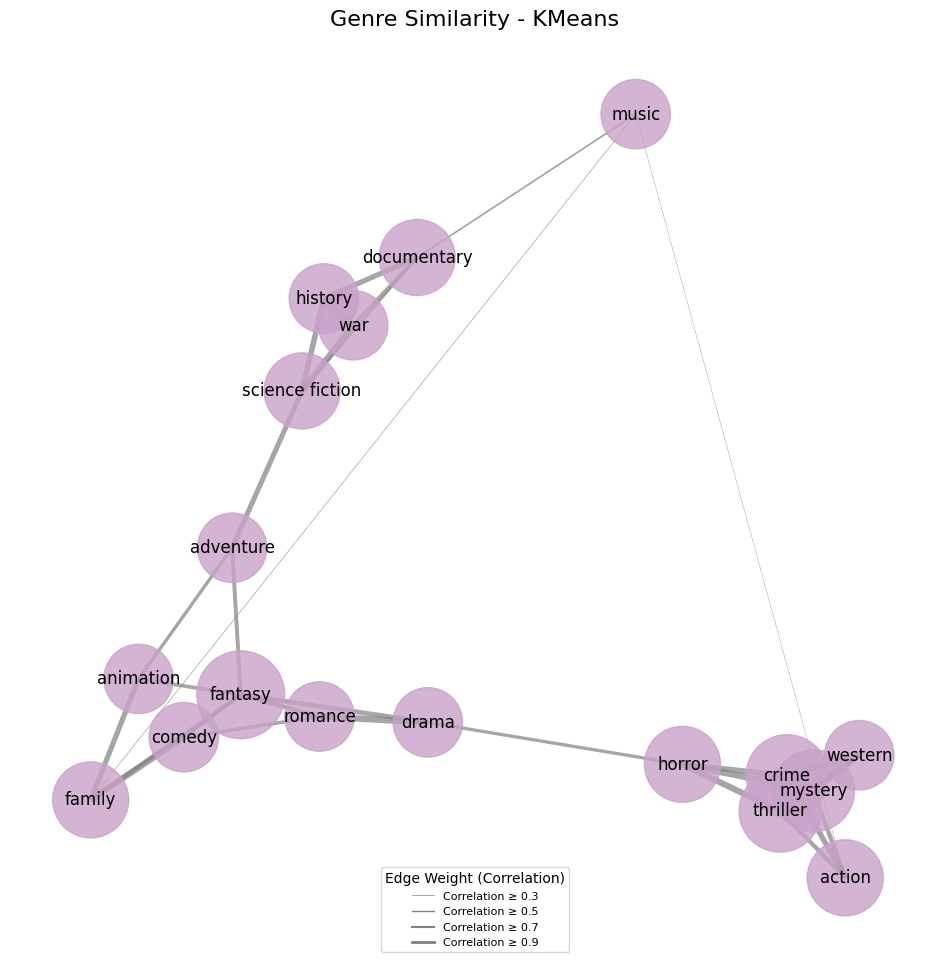

In [ ]:
# Create an empty graph
G_kmeans = nx.Graph()

# Add nodes and edges from the DataFrame
for _, row in top_correlations_kmeans_df.iterrows():
    genre = row['Genre']
    correlated_genre = row['Correlated Genre']
    correlation = row['Correlation']

    # Add an edge to the graph with the correlation weight
    G_kmeans.add_edge(genre, correlated_genre, weight=correlation)

# Node positions in the graph with a custom spring layout
pos_kmeans = nx.spring_layout(G_kmeans, seed=42, k=0.3)  # k adjusts the distance between nodes

# Calculate the degree of each node to size them
node_size_kmeans = [1000 + 500 * G_kmeans.degree(n) for n in G_kmeans.nodes]

# Draw the nodes
plt.figure(figsize=(12, 12))
nx.draw_networkx_nodes(G_kmeans, pos_kmeans, node_size=node_size_kmeans, node_color="#c8a2c8", alpha=0.8)

# Draw the edges with thickness proportional to the weight (correlation)
edges_kmeans = G_kmeans.edges(data=True)
nx.draw_networkx_edges(
    G_kmeans, pos_kmeans, edgelist=edges_kmeans,
    width=[d['weight'] * 5 for (_, _, d) in edges_kmeans],
    edge_color="gray", alpha=0.7
)

# Draw the node labels
nx.draw_networkx_labels(G_kmeans, pos_kmeans, font_size=12, font_color="black")

# Add a legend with the edge thickness
legend_labels = [f"{i/10:.1f}" for i in range(3, 10, 2)]
for i, label in enumerate(legend_labels):
    plt.plot([], [], color="gray", linewidth=(i+1)*0.5, label=f"Correlation ≥ {label}")

plt.legend(title="Edge Weight (Correlation)", loc="lower center", fontsize=8)
plt.title("Genre Similarity - KMeans", fontsize=16)
plt.axis("off")
plt.show()

Upon analyzing the cluster distributions and the frequency-based correlations, several **groups of similar genres** can be observed:

1. `Music`: As expected from previous analyses, **music** remains highly isolated in the dataset, with very low correlations to other genres. This reinforces its **distinctiveness** in comparison to other genres.

2. `War, Documentary, Science Fiction, and History`: The first group consists of **war**, **documentary**, **science fiction**, and **history**. The relationship between these genres is intuitive:
    - **War** films often depict historical events, and **history** can be represented both dramatically and in a **documentary** format.
    - However, **documentary** and **science fiction** show a relatively **weaker correlation** with each other.

3. `Adventure, Animation, Family, Fantasy, Comedy, Romance, and Drama`: A larger and more dispersed group includes **adventure**, **animation**, **family**, **fantasy**, **comedy**, **romance**, and **drama**. These genres tend to be more **generic** and frequently co-occur. For instance, **animated films** are often associated with **family** films, while **romance** and **comedy** often overlap in terms of audience and thematic elements.

4. `Horror, Thriller, Crime, Mystery, Western, and Action`: The final group includes **horror**, **thriller**, **crime**, **mystery**, **western**, and **action**. These genres are often **interrelated** due to thematic overlap, such as the **suspense** or **dangerous situations** central to both **thriller** and **horror**. Similarly, **crime** and **mystery** are highly correlated due to their focus on **investigative** and **criminal** elements. **Western** and **action** films also share a focus on **adventure** and physical confrontation, though they are less closely tied than other genres in this group.

These observations align with the **calculated genre correlations**, revealing natural **clusters based on thematic similarities**.


At this point, applying different clustering techniques will help provide new insights and potentially more meaningful results.

### **Hierarchical Clustering**

In [ ]:
sampled_data_with_embeddings.iloc[:, 21:(-3)]

,0,1,2,3,4,5,6,7,8,9,...,374,375,376,377,378,379,380,381,382,383
0,-0.018741,0.078743,-0.056997,0.022239,-0.012767,0.002861,0.035658,-0.076496,0.055950,-0.021272,...,0.080045,-0.008437,-0.030101,0.079252,-0.082381,-0.006349,0.111220,0.045406,-0.058995,-0.000923
1,-0.006607,-0.005071,0.019962,0.037904,0.030106,-0.002411,0.031843,0.007262,0.135110,0.042538,...,0.028799,0.015891,0.072760,0.052481,0.012239,-0.012196,-0.024753,-0.063238,-0.041562,-0.006004
2,-0.047521,0.021260,0.091409,0.049868,0.046836,-0.051556,-0.002370,-0.023923,-0.042195,-0.025193,...,-0.038362,-0.050280,-0.004730,-0.017866,0.002490,0.006747,0.033247,-0.047761,-0.005975,-0.000421
3,0.062270,-0.045747,-0.009792,0.106206,-0.026343,-0.029084,-0.020330,-0.034097,-0.006802,-0.023341,...,0.013808,-0.076200,0.033528,0.036781,-0.135812,-0.015292,0.127082,-0.049436,0.009895,-0.035062
4,0.053160,-0.032168,-0.032637,0.014572,-0.044132,0.075643,0.114306,-0.040693,0.039565,-0.071030,...,0.045820,-0.096224,-0.115401,0.018376,0.050983,0.002716,0.034627,0.013013,-0.059174,-0.046057
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
17995,-0.054384,0.033627,-0.064736,0.044278,-0.006628,-0.008081,0.032336,-0.009224,0.027277,-0.003174,...,-0.067497,-0.099952,0.021521,0.041993,-0.013185,-0.024794,0.109938,-0.028415,-0.016565,-0.021391
17996,0.002956,0.081174,0.012369,0.027415,-0.015936,0.029560,0.018962,-0.113141,-0.030480,-0.074534,...,0.051116,-0.039420,0.002486,0.128870,-0.004977,-0.030400,-0.034652,0.041744,-0.029426,0.076694
17997,-0.032464,0.017577,-0.066825,-0.006104,-0.009572,-0.056756,0.076736,-0.037376,0.045613,-0.016878,...,0.038449,-0.128775,0.035778,0.123330,-0.055888,0.015441,0.042456,-0.109164,0.003720,-0.054627
17998,-0.078577,0.134824,-0.052883,-0.093398,0.023777,0.044190,0.176597,-0.005957,0.035819,0.017446,...,0.037877,-0.059819,-0.049582,-0.027659,-0.044366,-0.016420,0.056735,0.067063,0.032940,-0.017705


Perform **Hierarchical Clustering** using the **Ward's method** to generate a dendrogram, which visualizes the hierarchical relationships between data points. A subset of the dataset containing the relevant embeddings is extracted to serve as the input for the clustering process. The `sch.linkage` function computes the hierarchical clustering, using the Ward method, which minimizes the variance within each cluster.

The **dendrogram** is plotted to visually represent the *cluster hierarchy*, with the x-axis showing the index of data points and the y-axis showing the distance between merged clusters.

This analysis provides insights into how data points are grouped together, helping to identify potential clusters at various levels of similarity.

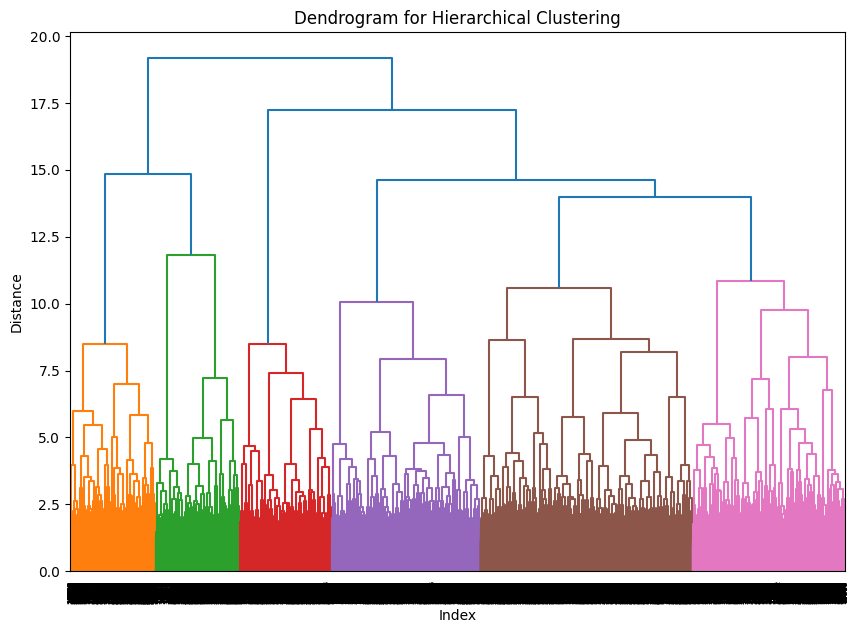

In [ ]:
# Use random sampled data
data = sampled_data_with_embeddings.iloc[:, 21:(-3)].values

# Create dendogram for hierarchical clustering
plt.figure(figsize=(10, 7))
sch.dendrogram(sch.linkage(data, method='ward'))  # Usa 'ward' per minimizzare la varianza
plt.title('Dendrogram for Hierarchical Clustering')
plt.xlabel('Index')
plt.ylabel('Distance')
plt.show()

To perform **hierarchical clustering**, due to high computational costs, it is necessary to work on a data sample. Use the subset obtained previously for data visualization.

In [ ]:
# Extract embeddings columns and convert to a NumPy array
embedding_sub = sampled_data_with_embeddings.iloc[:, 21:-3].values

# Now, embedding_array is a NumPy array
print(embedding_sub.shape)  # Check the shape of the array

(18000, 384)


In [ ]:
hc_df = sampled_data_with_embeddings.copy()
hc_df.shape

(18000, 408)

#### **Number of Clusters: 4**

Implement **Hierarchical Clustering** using the **Ward's method** to cluster data points, clustering data into 4 groups.


In [ ]:
# Compute linkage for hc
Z = sch.linkage(embedding_sub, method='ward', metric='euclidean')  # Use 'ward' o 'average'

# Set where to cut the dendogram
max_d = 4
clusters = sch.fcluster(Z, max_d, criterion='maxclust')

In [ ]:
# Add clustering to dataframe
hc_df['cluster_hierarchical4'] = clusters

Asses the `silhouette_score` and the `davies_bouldin_score`.

In [ ]:
# Compute silhouette score
sil_score = silhouette_score(embedding_sub, hc_df['cluster_hierarchical4'])
print(f"Silhouette Score (hc - 4 clusters): {sil_score}")

# Compute Davies-Bouldin Index
db_index = davies_bouldin_score(embedding_sub, hc_df['cluster_hierarchical4'])
print(f"Davies-Bouldin Index (hc - 4 clusters): {db_index}")

Silhouette Score (hc - 4 clusters): 0.00855212938040495
Davies-Bouldin Index (hc - 4 clusters): 6.249038729684189


The values are **lower** than **those** observed for the **k-means clustering**, indicating a poorer ability to detect clusters within the data. However, for the reasons previously mentioned, and due to the more interesting results obtained from the genre network analysis to understand genre similarities, we do not place much emphasis on the Silhouette and Davies-Bouldin scores. The only consideration that can be made is that, if the performance is worse, the algorithm might not have been able to assign genres effectively to the clusters, and it might not have captured the similarities between genres.

Visualize data as made previously.

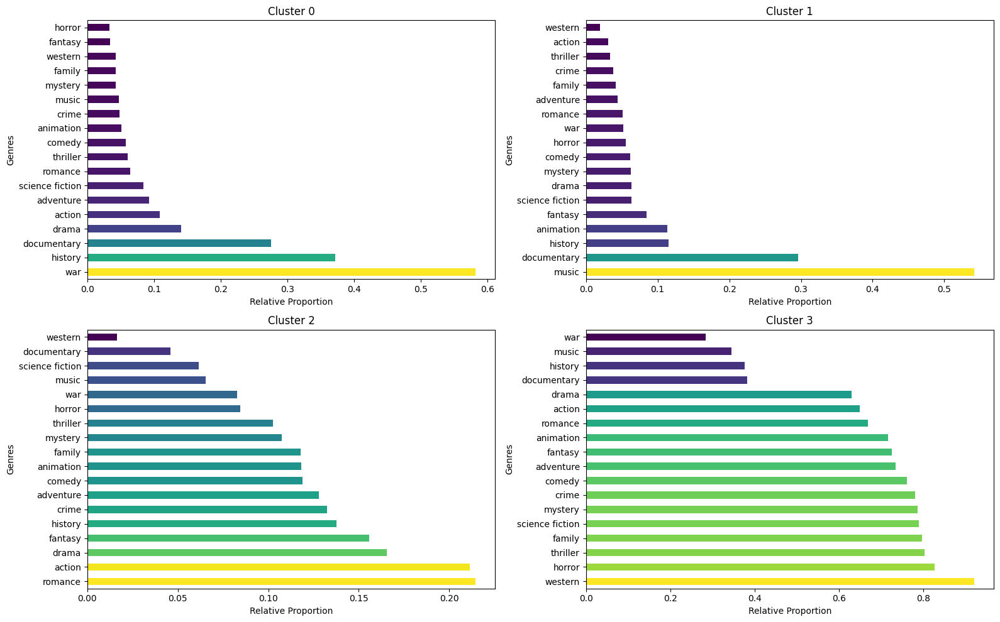

In [ ]:
# Contingency table for each cluster
contingency_table = hc_df.groupby('cluster_hierarchical4')[genre_columns].sum()

# Calculate the total distribution of genres in the dataset
genre_counts_total = sampled_data_with_embeddings[genre_columns].sum()

# Get the number of clusters to display (excluding cluster -1)
n_clusters = len(contingency_table)

# Set layout dimensions
n_cols = 2  # Set a reasonable number of columns for better visual appearance
n_rows = 2  # Calculate the required number of rows

# Create a figure with subplots
fig, axes = plt.subplots(n_rows, n_cols, figsize=(16, n_rows * 5))

# Flatten the axes array for easier iteration
axes = axes.flatten()

# Create a plot for each cluster
for i in range(n_clusters):
    ax = axes[i]  # Get the current axis

    # Get the data for the cluster
    cluster_data = contingency_table.iloc[i]

    # Calculate relative proportions for each genre in the cluster
    relative_proportions = cluster_data / genre_counts_total

    # Sort genres by relative proportions
    relative_proportions_sorted = relative_proportions.sort_values(ascending=False)

    # Normalize values to apply color map
    norm = mcolors.Normalize(vmin=relative_proportions_sorted.min(), vmax=relative_proportions_sorted.max())
    cmap = plt.cm.viridis

    # Plot the bar graph for the relative proportions
    relative_proportions_sorted.plot(kind='barh', color=cmap(norm(relative_proportions_sorted.values)), ax=ax)

    # Set the title and labels for the plot
    ax.set_title(f'Cluster {i}')
    ax.set_xlabel('Relative Proportion')
    ax.set_ylabel('Genres')

    # Set x-axis in scientific notation
    #ax.xaxis.set_major_formatter(ticker.ScalarFormatter())
    #ax.ticklabel_format(style='sci', axis='x', scilimits=(0,0))  # Set scientific notation

# Adjust layout to avoid overlap
plt.tight_layout()
plt.show()

In the first cluster (`cluster 0`), not many films seem to have been assigned, with the two most prevalent genres being **history** and **war**, each accounting for around **40% and 60% of the observations**. Once again, there is a cluster (`cluster 1`) with a predominance of **music** films, with about **50%** of films in this category, with other genres present at significantly lower levels, except for **documentary** with an honest **30%** of observations. The remaining `clusters`, `2` and `3`, appear to have relatively **balanced percentages across all genres**, with minimal differences and no clear predominance of any particular genre, with very low percentages for each genre in `cluster 2` and really high ones in `cluster 3`. This last observation suggests that the clustering isn't working well, randomly assigning movies into clusters.

Based on the results, the clusters do not seem to capture any distinct similarities between genres, likely due to an insufficient number of clusters in which the films were grouped.

**Genre Correlation Analysis**

In [ ]:
keep_col_hc = list(hc_df.columns[3:21])
keep_col_hc.append('cluster_hierarchical4')
keep_col_hc

['romance',
 'music',
 'comedy',
 'action',
 'science fiction',
 'thriller',
 'horror',
 'animation',
 'adventure',
 'war',
 'history',
 'drama',
 'mystery',
 'fantasy',
 'family',
 'western',
 'documentary',
 'crime',
 'cluster_hierarchical4']

In [ ]:
# Group by cluster and sum the genre columns
genre_distribution_hc = hc_df[keep_col_hc].groupby('cluster_hierarchical4').sum()

# Calculate the relative frequency (divide by the total number of films in each cluster)
genre_frequency_hc = genre_distribution_hc.div(genre_distribution_hc.sum(axis=1), axis=0)

In [ ]:
# Calculate the correlation between genres in the clusters
genre_correlation_hc = genre_frequency_hc.corr()

# Find the most correlated genre for each genre
for genre in genre_correlation_hc.columns:
    # Sort the genres by correlation, excluding the current genre
    top_correlated_hc = genre_correlation_hc[genre].drop(genre).sort_values(ascending=False).head(3)  # Take the top 3

    # Print the most correlated genres
    print(f"\nGenre: {genre}")
    for correlated_genre, correlation in top_correlated_hc.items():
        print(f"  - Most correlated with: {correlated_genre} (correlation: {correlation:.2f})")


Genre: romance
  - Most correlated with: action (correlation: 0.88)
  - Most correlated with: crime (correlation: 0.77)
  - Most correlated with: fantasy (correlation: 0.71)

Genre: music
  - Most correlated with: documentary (correlation: 0.75)
  - Most correlated with: animation (correlation: 0.68)
  - Most correlated with: fantasy (correlation: 0.12)

Genre: comedy
  - Most correlated with: mystery (correlation: 0.98)
  - Most correlated with: family (correlation: 0.98)
  - Most correlated with: crime (correlation: 0.94)

Genre: action
  - Most correlated with: romance (correlation: 0.88)
  - Most correlated with: drama (correlation: 0.87)
  - Most correlated with: adventure (correlation: 0.78)

Genre: science fiction
  - Most correlated with: western (correlation: 0.96)
  - Most correlated with: horror (correlation: 0.70)
  - Most correlated with: thriller (correlation: 0.59)

Genre: thriller
  - Most correlated with: family (correlation: 0.94)
  - Most correlated with: crime (cor

In [ ]:
# Create a DataFrame to save most correlated genres
top_correlations_hc = []

for genre in genre_correlation_hc.columns:
    top_correlated = genre_correlation_hc[genre].drop(genre).sort_values(ascending=False).head(3)
    for correlated_genre, correlation in top_correlated.items():
        top_correlations_hc.append({'Genre': genre, 'Correlated Genre': correlated_genre, 'Correlation': correlation})

top_correlations_hc_df = pd.DataFrame(top_correlations_hc)
print(top_correlations_hc_df)

              Genre Correlated Genre  Correlation
0           romance           action     0.880512
1           romance            crime     0.772536
2           romance          fantasy     0.711501
3             music      documentary     0.753584
4             music        animation     0.680671
5             music          fantasy     0.120830
6            comedy          mystery     0.982793
7            comedy           family     0.980332
8            comedy            crime     0.939557
9            action          romance     0.880512
10           action            drama     0.865101
11           action        adventure     0.778463
12  science fiction          western     0.958242
13  science fiction           horror     0.701449
14  science fiction         thriller     0.592943
15         thriller           family     0.943669
16         thriller            crime     0.927279
17         thriller        adventure     0.896450
18           horror          mystery     0.973925


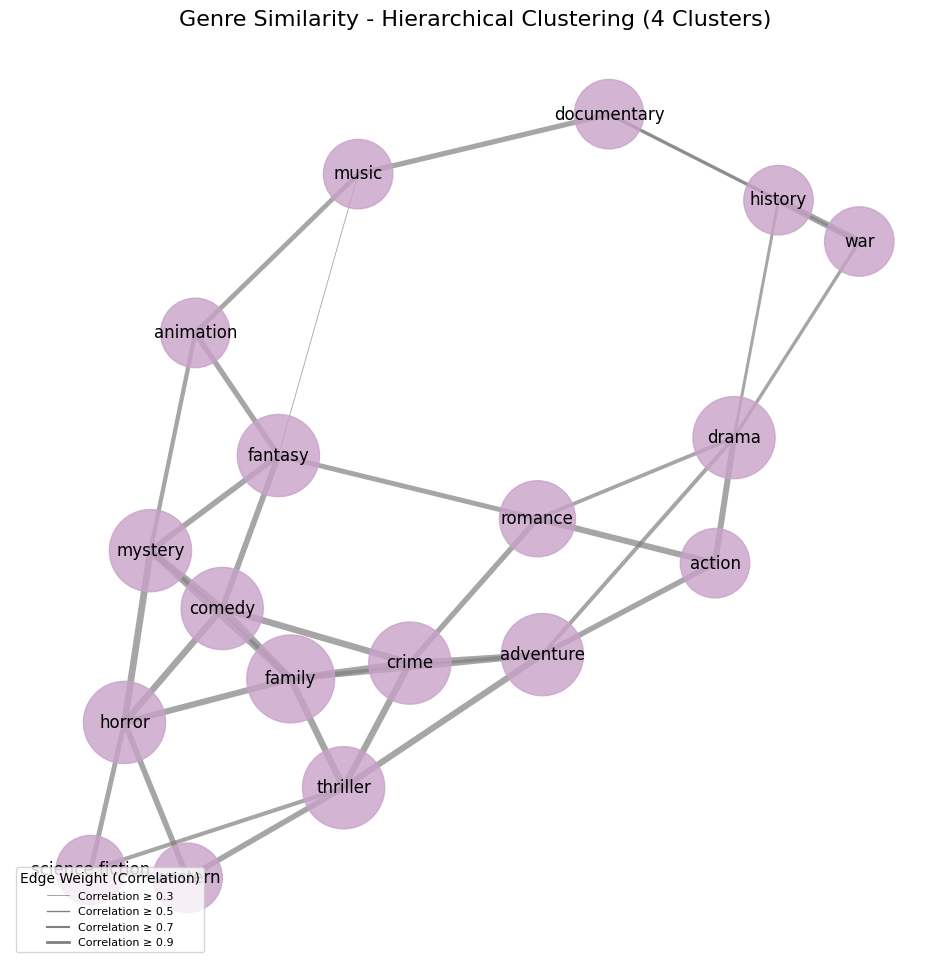

In [ ]:
# Create an empty graph
G_hc = nx.Graph()

# Add nodes and edges from the DataFrame
for _, row in top_correlations_hc_df.iterrows():
    genre = row['Genre']
    correlated_genre = row['Correlated Genre']
    correlation = row['Correlation']

    # Add an edge to the graph with the correlation weight
    G_hc.add_edge(genre, correlated_genre, weight=correlation)

# Node positions in the graph with a customized spring layout
pos_hc = nx.spring_layout(G_hc, seed=42, k=0.3)  # k adjusts the distance between nodes

# Calculate the degree of each node to size them
node_size_hc = [1000 + 500 * G_hc.degree(n) for n in G_hc.nodes]

# Draw the nodes
plt.figure(figsize=(12, 12))
nx.draw_networkx_nodes(G_hc, pos_hc, node_size=node_size_hc, node_color="#c8a2c8", alpha=0.8)

# Draw the edges with thickness proportional to the weight (correlation)
edges_hc = G_hc.edges(data=True)
nx.draw_networkx_edges(
    G_hc, pos_hc, edgelist=edges_hc,
    width=[d['weight'] * 5 for (_, _, d) in edges_hc],
    edge_color="gray", alpha=0.7
)

# Draw the node labels
nx.draw_networkx_labels(G_hc, pos_hc, font_size=12, font_color="black")

# Add a legend with the edge thickness
legend_labels = [f"{i/10:.1f}" for i in range(3, 10, 2)]
for i, label in enumerate(legend_labels):
    plt.plot([], [], color="gray", linewidth=(i+1)*0.5, label=f"Correlation ≥ {label}")

plt.legend(title="Edge Weight (Correlation)", loc="lower left", fontsize=8)
plt.title("Genre Similarity - Hierarchical Clustering (4 Clusters)", fontsize=16)
plt.axis("off")
plt.show()

In this case, it is clear that the result is **not well-defined**: all **genres** appear to be **highly correlated with one another**, and there are no clear, well-defined groups of similar genres. The genres that seem somewhat more separated are **history, war**, and **documentary**, which are quite close to each other and reasonably sensible in their association. The **music** genre also appears more separated, though still relatively close, suggesting a degree of isolation in its clustering.

The result obtained does not seem as satisfactory as it appeared for the k-means clustering. Therefore, further techniques will be tested to improve the analysis and gain more meaningful insights.

#### **Number of Clusters: 8**

Try to apply hierarchical clustering, organizing data into 8 clusters.

In [ ]:
# Compute linkage for hc
Z = sch.linkage(embedding_sub, method='ward', metric='euclidean')  # Usa 'ward' o 'average'

# Set where to cut the dendogram
max_d = 8
clusters = sch.fcluster(Z, max_d, criterion='maxclust')

In [ ]:
# Add clustering to the dataframe
hc_df['cluster_hierarchical8'] = clusters

Asses the `silhouette_score` and the `davies_bouldin_score`.

In [ ]:
# Compute silhouette score
sil_score = silhouette_score(embedding_sub, hc_df['cluster_hierarchical8'])
print(f"Silhouette Score (hc - 8 clusters): {sil_score}")

# Compute Davies-Bouldin Index
db_index = davies_bouldin_score(embedding_sub, hc_df['cluster_hierarchical8'])
print(f"Davies-Bouldin Index (hc - 8 clusters): {db_index}")

Silhouette Score (hc - 8 clusters): 0.0036224031355232
Davies-Bouldin Index (hc - 8 clusters): 6.619584201928325


The values are relatively low and align closely with those observed in hierarchical clustering with 4 groups. Therefore, the expectations for this approach may mirror the performances obtained with the same algorithm.

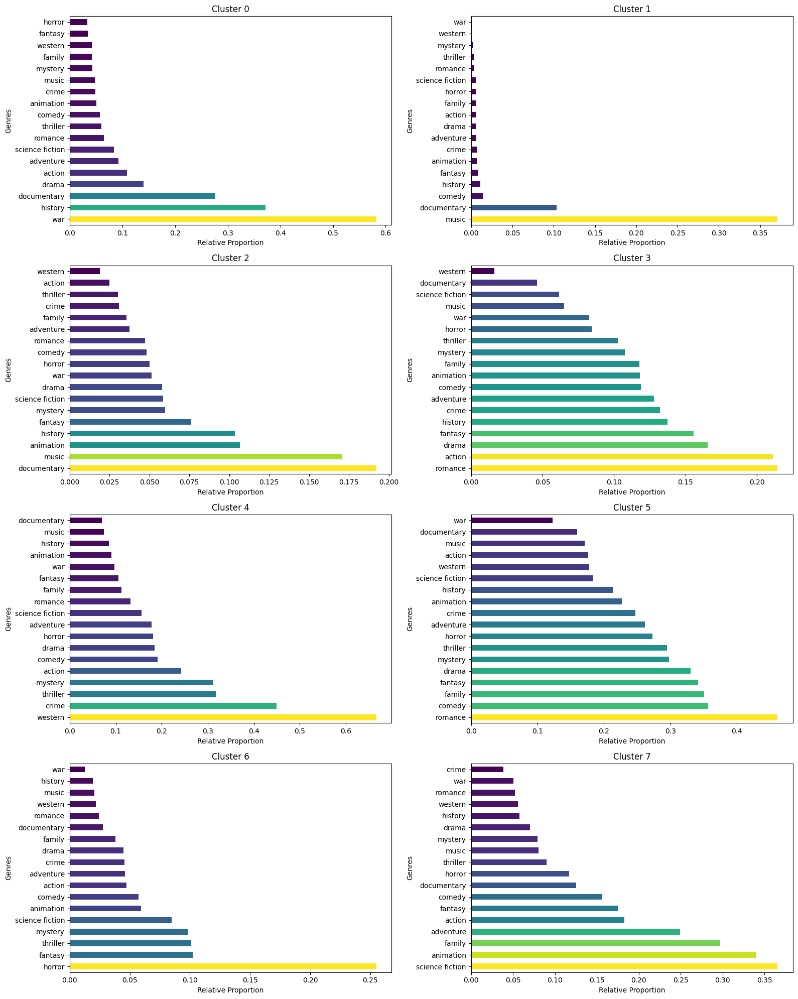

In [ ]:
# Contingency table for each cluster
contingency_table = hc_df.groupby('cluster_hierarchical8')[genre_columns].sum()

# Calculate the total distribution of genres in the dataset
genre_counts_total = sampled_data_with_embeddings[genre_columns].sum()

# Get the number of clusters to display
n_clusters = len(contingency_table)

# Set layout dimensions
n_cols = 2
n_rows = 4

# Create a figure with subplots
fig, axes = plt.subplots(n_rows, n_cols, figsize=(16, n_rows * 5))

# Flatten the axes array for easier iteration
axes = axes.flatten()

# Create a plot for each cluster
for i in range(n_clusters):
    ax = axes[i]  # Get the current axis

    # Get the data for the cluster
    cluster_data = contingency_table.iloc[i]

    # Calculate relative proportions for each genre in the cluster
    relative_proportions = cluster_data / genre_counts_total

    # Sort genres by relative proportions
    relative_proportions_sorted = relative_proportions.sort_values(ascending=False)

    # Normalize values to apply color map
    norm = mcolors.Normalize(vmin=relative_proportions_sorted.min(), vmax=relative_proportions_sorted.max())
    cmap = plt.cm.viridis

    # Plot the bar graph for the relative proportions
    relative_proportions_sorted.plot(kind='barh', color=cmap(norm(relative_proportions_sorted.values)), ax=ax)

    # Set the title and labels for the plot
    ax.set_title(f'Cluster {i}')
    ax.set_xlabel('Relative Proportion')
    ax.set_ylabel('Genres')

    # Set x-axis in scientific notation
    #ax.xaxis.set_major_formatter(ticker.ScalarFormatter())
    #ax.ticklabel_format(style='sci', axis='x', scilimits=(0,0))  # Set scientific notation

# Adjust layout to avoid overlap
plt.tight_layout()
plt.show()

The distribution of genres within the clusters reveals distinct trends and emphasizes the limitations of the clustering approach. **Cluster 0** is largely dominated by **war** films, with **history** following at roughly half the representation. **Cluster 1** is strongly characterized by **music**, which appears to be the most distinct and well-defined genre in the dataset. **Cluster 4**, although showing smaller overall proportions, exhibits higher percentages of **western**, **mystery**, and **crime** films, indicating some thematic concentration.

In contrast, **clusters 2**, **3**, and **5** show much weaker patterns due to balanced distributions, and for the first two clusters all genres are represented at very low levels, around **20%** for the most frequent genres, while in `cluster 5` percentages are a little bit higher. This suggests that these clusters may consist of observations classified more arbitrarily, lacking clear thematic focus. Similarly, **clusters 6** has very low proportions of movies in each genre, lower than **10%**, except for the most predominant genre, **horror**, which has a proportion of only **25%** of movies. In **cluster 7** the most frequent genres are **science fiction, animation** and **family**, with around **30%** of movies for each of them, a non-significantly high proportion.

The observed results suggest that while some clusters capture dominant genres effectively, others fail to provide clear or significant insights. These findings underscore the challenges of clustering genres with significant overlap and dispersion, reinforcing the need for refined methods to better capture the relationships within the dataset.

**Genre Correlation Analysis**

In [ ]:
keep_col_hc8 = list(hc_df.columns[3:21])
keep_col_hc8.append('cluster_hierarchical8')
keep_col_hc8

['romance',
 'music',
 'comedy',
 'action',
 'science fiction',
 'thriller',
 'horror',
 'animation',
 'adventure',
 'war',
 'history',
 'drama',
 'mystery',
 'fantasy',
 'family',
 'western',
 'documentary',
 'crime',
 'cluster_hierarchical8']

In [ ]:
# Group by cluster and sum the genre columns
genre_distribution_hc8 = hc_df[keep_col_hc8].groupby('cluster_hierarchical8').sum()

# Calculate the relative frequency (divide by the total number of movies in each cluster)
genre_frequency_hc8 = genre_distribution_hc8.div(genre_distribution_hc8.sum(axis=1), axis=0)

In [ ]:
# Calculate the correlation between genres in the clusters
genre_correlation_hc8 = genre_frequency_hc8.corr()

# Find the most correlated genre for each genre
for genre in genre_correlation_hc8.columns:
    # Sort the genres by correlation, excluding the current genre
    top_correlated_hc8 = genre_correlation_hc8[genre].drop(genre).sort_values(ascending=False).head(3)  # Take the top 3

    # Print the most correlated genres
    print(f"\nGenre: {genre}")
    for correlated_genre, correlation in top_correlated_hc8.items():
        print(f"  - Most correlated with: {correlated_genre} (correlation: {correlation:.2f})")


Genre: romance
  - Most correlated with: drama (correlation: 0.78)
  - Most correlated with: comedy (correlation: 0.56)
  - Most correlated with: action (correlation: 0.39)

Genre: music
  - Most correlated with: documentary (correlation: 0.79)
  - Most correlated with: history (correlation: -0.20)
  - Most correlated with: war (correlation: -0.25)

Genre: comedy
  - Most correlated with: family (correlation: 0.73)
  - Most correlated with: fantasy (correlation: 0.64)
  - Most correlated with: adventure (correlation: 0.60)

Genre: action
  - Most correlated with: adventure (correlation: 0.69)
  - Most correlated with: drama (correlation: 0.45)
  - Most correlated with: family (correlation: 0.43)

Genre: science fiction
  - Most correlated with: animation (correlation: 0.83)
  - Most correlated with: adventure (correlation: 0.80)
  - Most correlated with: family (correlation: 0.76)

Genre: thriller
  - Most correlated with: mystery (correlation: 0.94)
  - Most correlated with: crime (c

In [ ]:
# Crea a DataFrame to save most correlated genres
top_correlations_hc8 = []

for genre in genre_correlation_hc8.columns:
    top_correlated8 = genre_correlation_hc8[genre].drop(genre).sort_values(ascending=False).head(3)
    for correlated_genre, correlation in top_correlated8.items():
        top_correlations_hc8.append({'Genre': genre, 'Correlated Genre': correlated_genre, 'Correlation': correlation})

top_correlations_hc8_df = pd.DataFrame(top_correlations_hc8)
print(top_correlations_hc8_df)

              Genre Correlated Genre  Correlation
0           romance            drama     0.784700
1           romance           comedy     0.560580
2           romance           action     0.385752
3             music      documentary     0.792754
4             music          history    -0.204564
5             music              war    -0.249469
6            comedy           family     0.733297
7            comedy          fantasy     0.638919
8            comedy        adventure     0.597484
9            action        adventure     0.692011
10           action            drama     0.452063
11           action           family     0.431879
12  science fiction        animation     0.829726
13  science fiction        adventure     0.796464
14  science fiction           family     0.762226
15         thriller          mystery     0.938348
16         thriller            crime     0.730959
17         thriller           horror     0.685273
18           horror         thriller     0.685273


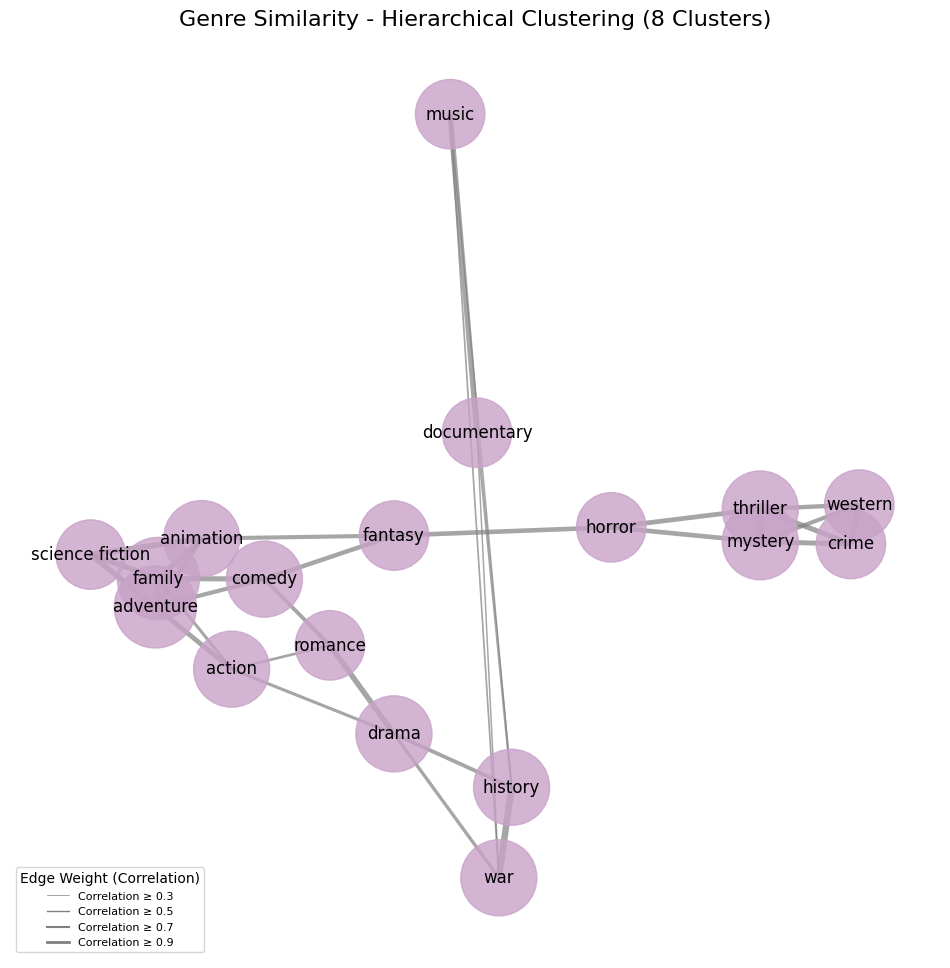

In [ ]:
# Create an empty graph
G_hc8 = nx.Graph()

# Add the nodes and edges from the DataFrame
for _, row in top_correlations_hc8_df.iterrows():
    genre = row['Genre']
    correlated_genre = row['Correlated Genre']
    correlation = row['Correlation']

    # Add an edge to the graph with the weight of the correlation
    G_hc8.add_edge(genre, correlated_genre, weight=correlation)

# Positions of the nodes in the graph with a custom spring layout
pos_hc8 = nx.spring_layout(G_hc8, seed=42, k=0.3)  # k controls the distance between nodes

# Calculate the degree of each node to size them
node_size_hc8 = [1000 + 500 * G_hc8.degree(n) for n in G_hc8.nodes]

# Draw the nodes
plt.figure(figsize=(12, 12))
nx.draw_networkx_nodes(G_hc8, pos_hc8, node_size=node_size_hc8, node_color="#c8a2c8", alpha=0.8)

# Draw the edges with thickness proportional to the weight (correlation)
edges_hc8 = G_hc8.edges(data=True)
nx.draw_networkx_edges(
    G_hc8, pos_hc8, edgelist=edges_hc8,
    width=[d['weight'] * 5 for (_, _, d) in edges_hc8],
    edge_color="gray", alpha=0.7
)

# Draw the labels of the nodes
nx.draw_networkx_labels(G_hc8, pos_hc8, font_size=12, font_color="black")

# Add a legend with edge thickness
legend_labels = [f"{i/10:.1f}" for i in range(3, 10, 2)]
for i, label in enumerate(legend_labels):
    plt.plot([], [], color="gray", linewidth=(i+1)*0.5, label=f"Correlation ≥ {label}")

plt.legend(title="Edge Weight (Correlation)", loc="lower left", fontsize=8)
plt.title("Genre Similarity - Hierarchical Clustering (8 Clusters)", fontsize=16)
plt.axis("off")
plt.show()

The current clustering results show a small improvement compared to the **hierarchical clustering** approach with **four** clusters. Smaller, more distinct genre groups have emerged, adding some clarity to the structure of the data. A notable grouping includes **crime**, **western**, **mystery**, **thriller**, and **horror**, closely resembling a similar cluster observed using **k-means**. Meanwhile, a larger, more dispersed group comprises the remaining genres, with **documentary** and **music** continuing to exhibit isolation from other genres.

Despite these improvements, a significant issue persists: the **high correlations between genres**. This likely stems from earlier observations on the relative frequency distributions of genres across clusters, which suggested arbitrary clustering rather than meaningful separations. This overlap diminishes the interpretability and utility of the clusters.

Given the **multi-label nature of the problem**, a promising next step would be to explore **soft clustering techniques**. These methods could account for the overlapping nature of the data, potentially yielding better-aligned clusters and more informative insights into the genre relationships within the dataset.


### **Fuzzy**

To identify the optimal number of clusters for **Fuzzy C-Means (FCM)** clustering, calculate the **Fuzzy Partition Coefficient (FPC)** across a range of cluster counts. The **FPC** measures the quality of clustering, with higher values indicating better-defined and more cohesive clusters.

The embeddings are transposed to ensure the correct shape for FCM (features as rows, samples as columns). For each number of clusters in the specified range, the FCM algorithm is applied, and the corresponding **FPC** is recorded.

To identify the optimal number of clusters, the **elbow method** is employed, where the **KneeLocator** detects the point where the **FPC** curve shows a sharp change. This point represents the most appropriate cluster count.

Finally, the results are visualized in a plot, highlighting the FPC values and the optimal number of clusters, facilitating the interpretation of the clustering performance.

The procedure is similar to that of **K-Means** clustering.

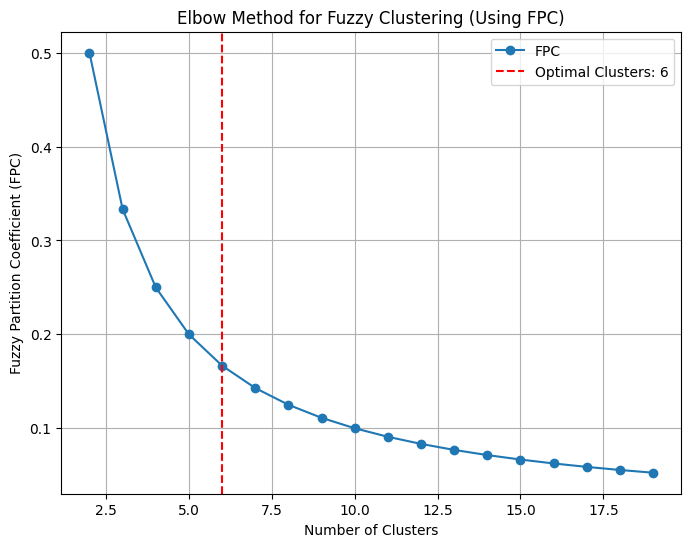

In [ ]:
# Ensure embeddings are transposed correctly
X = embeddings.T  # Shape should be (features, samples)

# Define the range of clusters to evaluate
cluster_range = range(2, 20)
fpc = []

# Compute Fuzzy C-Means for different numbers of clusters
for n_clusters in cluster_range:
    cntr, u, u0, d, jm, p, fpc_value = fuzz.cluster.cmeans(
        X, n_clusters, m=2, error=0.005, maxiter=1000, init=None, seed=42
    )
    fpc.append(fpc_value)

# Use KneeLocator to find the elbow point
knee_locator = KneeLocator(cluster_range, fpc, curve="convex", direction="decreasing")
optimal_clusters = knee_locator.knee

# Plot FPC and the elbow point
plt.figure(figsize=(8, 6))
plt.plot(cluster_range, fpc, marker='o', label='FPC')
plt.axvline(x=optimal_clusters, color='red', linestyle='--', label=f'Optimal Clusters: {optimal_clusters}')
plt.title('Elbow Method for Fuzzy Clustering (Using FPC)')
plt.xlabel('Number of Clusters')
plt.ylabel('Fuzzy Partition Coefficient (FPC)')
plt.legend()
plt.grid()
plt.show()

In [ ]:
# Apply Fuzzy C-Means
cntr, u, u0, d, jm, p, fpc_value = fuzz.cluster.cmeans(
    X, c=optimal_clusters, m=2, error=0.005, maxiter=1000, init=None, seed=42
)

# u is the membership matrix (clusters x samples)
# To get cluster memberships for each data point, use np.argmax on membership values
membership_probabilities = u.T  # Transpose for shape (samples, clusters)
hard_cluster_assignments = np.argmax(membership_probabilities, axis=1)

In [ ]:
# Add results to the dataset
subset_clean_embeddings['fuzzy_cluster'] = hard_cluster_assignments

To evaluate the performance of fuzzy clustering, calculate `Log Loss` and `Jaccard` Score. Here’s an explanation and the steps involved:
1.	**Log Loss**: This metric measures the accuracy of the predicted probabilities by comparing them with the true binary labels. A lower Log Loss indicates better performance.
2.	**Jaccard Score**: The Jaccard Index is used for evaluating the similarity between finite sample sets. The Jaccard Score is calculated by comparing the binary predictions with the true labels. The average=‘samples’ option computes the Jaccard Score for each sample (movie) and returns the average.

In [ ]:
# Ground truth -> actual labels (genres)
ground_truth = subset_clean_embeddings[list(subset_clean_embeddings.columns[3:21])]

# Cluster aggregation -> genres
fuzzy_to_genre = np.dot(u, ground_truth.values)

# Normalize the probabilities to obtain a valid distribution
fuzzy_to_genre = fuzzy_to_genre / fuzzy_to_genre.sum(axis=1, keepdims=True)

# Project fuzzy clusters onto genres
predicted_genres = np.dot(u.T, fuzzy_to_genre)

In [ ]:
# Compute log-loss
log_loss_value = log_loss(ground_truth.values, predicted_genres)
print(f"Log Loss: {log_loss_value}")

# Binarize fuzzy predictions
predicted_binary = (predicted_genres > 0.1).astype(int)

# Compute Jaccard Score
jaccard = jaccard_score(ground_truth.values, predicted_binary, average='samples')
print(f"Jaccard Score: {jaccard}")

Log Loss: 3.8649215647711928
Jaccard Score: 0.2386189096338106


**Log Loss**: A value of **3.86** reflects poor calibration, with significant deviations between predicted probabilities and true labels. This highlights difficulties in accurately modeling genre probabilities.

**Jaccard Score**: A score of **0.2386** indicates weak overlap between predicted and true genres, suggesting limited alignment with actual multi-label assignments.  

The metrics highlight weaknesses in the fuzzy clustering approach, including poor predictive accuracy and limited genre separation. High correlations among genres likely contribute to overly generalized cluster assignments. Thus, let's check how genres distribution is.

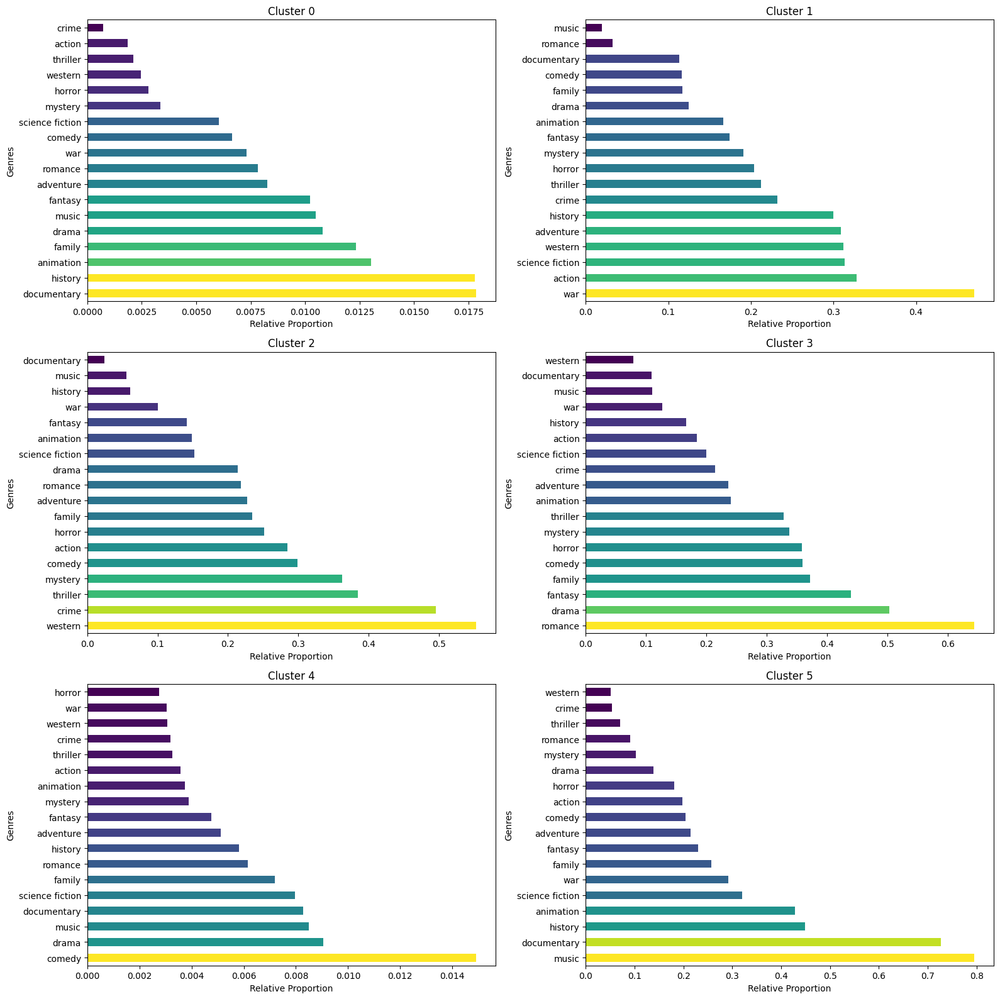

In [ ]:
# Contingency table for each cluster
contingency_table = subset_clean_embeddings.groupby('fuzzy_cluster')[genre_columns].sum()

# Genre distribution on entire dataset
genre_counts_total = subset_clean[genre_columns].sum()

# Set the number of clusters found by the algorithm
n_clusters = len(contingency_table)

# Set layout dimensions
n_rows = 3
n_cols = 2

# Create a figure with subplots
plt.figure(figsize=(16, 16))

# Create a barplot for each cluster
for i in range(n_clusters):
    plt.subplot(n_rows, n_cols, i+1)  # Disposizione in 4 righe e 2 colonne
    cluster_data = contingency_table.iloc[i]

    # Compute relative proportion for each genre in the cluster (n. obs of the genre in the cluster / total n. obs of that genre)
    relative_proportions = cluster_data / genre_counts_total

    # Sort genres by relatives proportions
    relative_proportions_sorted = relative_proportions.sort_values(ascending=False)

    # Normalize value to create a color map
    norm = mcolors.Normalize(vmin=relative_proportions_sorted.min(), vmax=relative_proportions_sorted.max())
    cmap = plt.cm.viridis

    # Create graph
    relative_proportions_sorted.plot(kind='barh', color=cmap(norm(relative_proportions_sorted.values)), ax=plt.gca())

    # Add title and labels
    plt.title(f'Cluster {i}')
    plt.xlabel('Relative Proportion')
    plt.ylabel('Genres')

# Improve visualization
plt.tight_layout()
plt.show()

The examination of genre proportions within each cluster reveals distinct patterns but also highlights potential issues of overgeneralization and randomness in some cluster assignments.

- **Clusters 0 and 4**: These clusters exhibit very low proportions for each genre, with less than **1.7% of films per genre**. This suggests that they may lack relevance and could predominantly include data points assigned arbitrarily, possibly representing outliers or uncertain cases.

- **Cluster 1**: This cluster demonstrates strong genre associations, with over **40% of war films**, around **30% of history, action, science fiction, adventure, and western films**. These genres share thematic similarities, reflecting a cohesive grouping.

- **Cluster 2**: Genres like **western (50%)** and **crime (50%)** dominate this cluster, followed closely by **mystery (40%)** and **thriller (40%)**, showcasing realistic affinities between these genres.

- **Cluster 3**: This cluster is heavily composed of **romance (60%)**, **drama (50%)**, and **fantasy (40%)** films. However, moderate proportions of other genres suggest some level of overgeneralization, which may dilute the apparent dominance of specific genres.

- **Cluster 5**: The most distinct grouping, this cluster includes **nearly 80% of music films** and **over 70% of documentaries**, with moderate contributions from other genres. This clear concentration of certain genres reinforces its uniqueness.

While some clusters reveal clear patterns of genre affinity, the low relevance of clusters 0 and 4, along with the moderate proportions of unrelated genres in others, indicate potential shortcomings. Nevertheless, the emergence of distinct patterns offers a foundation for further exploration and meaningful insights into genre relationships.

In [ ]:
cfuzzy_df = pd.merge(subset_clean_embeddings[['overview','fuzzy_cluster']],
             sampled_data_with_embeddings[['overview','genre','tSNE_1', 'tSNE_2']], on='overview')

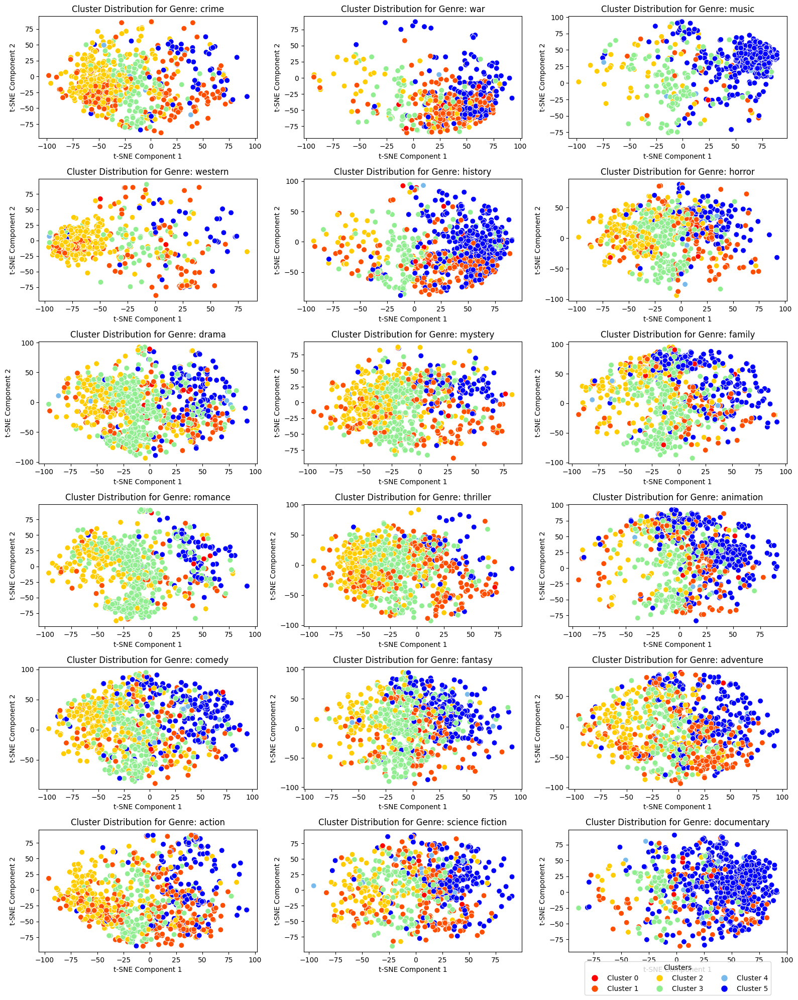

In [ ]:
# Assuming that kmeans_df and tsne are already defined
n_genres = len(cfuzzy_df['genre'].value_counts().index)

# Define the layout of the grid (6 rows, 3 columns)
n_cols = 3
n_rows = 6

# Create a figure with subplots arranged in 6x3 grid
plt.figure(figsize=(16, 20))

# Define the custom color palette for clusters
custom_palette = [
    'red', '#FF4D00', '#FFCC00', 'lightgreen',
    '#79baec', 'blue', 'purple', '#DA70D6'
]

# Loop through each genre and create a subplot for each
for i, genre in enumerate(cfuzzy_df['genre'].value_counts().index):  # Iterating over unique genres
    # Get the subset of data for the current genre
    genre_subset = cfuzzy_df[cfuzzy_df['genre'] == genre]

    # Perform t-SNE dimensionality reduction for the current genre subset
    reduced_genre_embeddings = genre_subset[['tSNE_1', 'tSNE_2']]  # Use tSNE columns directly

    # Create a subplot for the current genre (position calculated by i)
    plt.subplot(n_rows, n_cols, i + 1)

    # Plot the genre data with cluster colors (using the custom palette)
    sns.scatterplot(x=reduced_genre_embeddings['tSNE_1'], y=reduced_genre_embeddings['tSNE_2'], hue=genre_subset['fuzzy_cluster'],
                    palette={j: custom_palette[j] for j in range(len(custom_palette))}, s=60, legend=None)

    # Add title and labels
    plt.title(f'Cluster Distribution for Genre: {genre}')
    plt.xlabel('t-SNE Component 1')
    plt.ylabel('t-SNE Component 2')

    # Hide the legend to avoid overlap
    plt.legend([], [], frameon=False)

# Add a color legend for the clusters at the bottom of the figure
# Get unique cluster labels from the DataFrame
unique_clusters = cfuzzy_df['fuzzy_cluster'].unique()

# Create custom handles for the legend (one for each cluster label)
handles = [mlines.Line2D([], [], marker='o', color='w', markerfacecolor=custom_palette[i], markersize=10, label=f'Cluster {i}') for i in range(len(unique_clusters))]

# Add the legend below the plots
plt.legend(handles=handles, title='Clusters', bbox_to_anchor=(0.5, -0.05), loc='upper center', ncol=len(unique_clusters) // 2)

# Adjust layout to avoid overlap and improve the display
plt.tight_layout()

# Show the plot
plt.show()

/var/folders/w7/0xpq0vds7cz2333831nfq5dc0000gn/T/ipykernel_60549/4183062008.py:10: UserWarning: The palette list has more values (8) than needed (6), which may not be intended.
  sns.scatterplot(x=cfuzzy_df.tSNE_1, y=cfuzzy_df.tSNE_2, hue=cfuzzy_df['fuzzy_cluster'], palette=custom_palette, s=60)


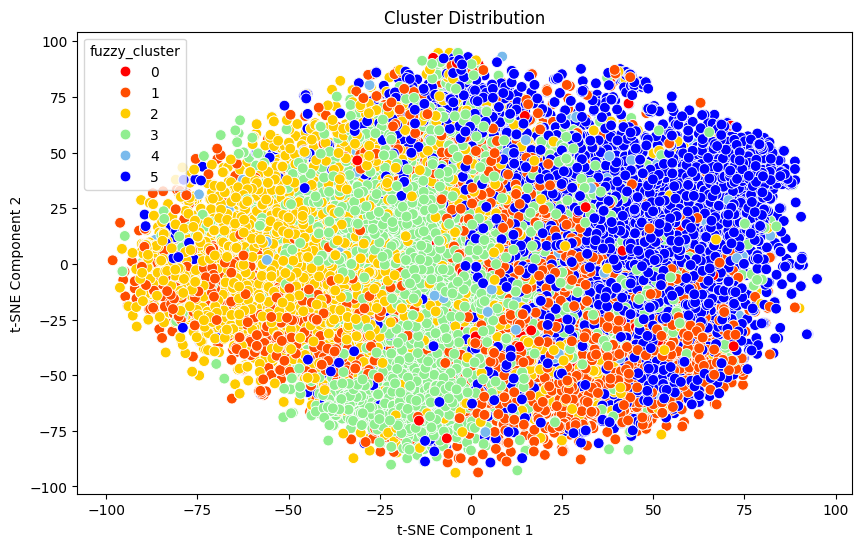

In [ ]:
# Define the custom color palette for clusters
custom_palette = [
    'red', '#FF4D00', '#FFCC00', 'lightgreen',
    '#79baec','blue', 'purple', '#DA70D6'
]

plt.figure(figsize=(10, 6))

# Create a scatter plot with custom colors
sns.scatterplot(x=cfuzzy_df.tSNE_1, y=cfuzzy_df.tSNE_2, hue=cfuzzy_df['fuzzy_cluster'], palette=custom_palette, s=60)

# Add title and labels
plt.title('Cluster Distribution')
plt.xlabel('t-SNE Component 1')
plt.ylabel('t-SNE Component 2')

# Display the plot
plt.show()

Both visualizations, whether highlighting individual genres or encompassing all observations, reinforce the findings from the relative frequency analysis of clusters:

- **Dominance of Clusters 2, 3, and 5**: Represented by **yellow, green, and blue**, these clusters clearly dominate the space, reflecting their previously noted higher proportions of observations across genres.  
- **Insignificance of Clusters 0 and 4**: Identified by **red and light blue**, these clusters are nearly invisible in the visualizations, confirming their minimal role in capturing meaningful data structures.  

The visuals emphasize the limited utility of some clusters (0 and 4) and underline the concentration of meaningful observations in a few dominant clusters.  

**Genre Correlation Analysis**

In [ ]:
keep_col_fuzzy = list(subset_clean_embeddings.columns[3:21])
keep_col_fuzzy.append('fuzzy_cluster')
keep_col_fuzzy

['romance',
 'music',
 'comedy',
 'action',
 'science fiction',
 'thriller',
 'horror',
 'animation',
 'adventure',
 'war',
 'history',
 'drama',
 'mystery',
 'fantasy',
 'family',
 'western',
 'documentary',
 'crime',
 'fuzzy_cluster']

In [ ]:
# Group by cluster and sum the genre columns
genre_distribution_fuzzy = subset_clean_embeddings[keep_col_fuzzy].groupby('fuzzy_cluster').sum()

# Calculate the relative frequency (divide by the total number of movies in each cluster)
genre_frequency_fuzzy = genre_distribution_fuzzy.div(genre_distribution_fuzzy.sum(axis=1), axis=0)

In [ ]:
# Calculate the correlation between genres in the clusters
genre_correlation_fuzzy = genre_frequency_fuzzy.corr()

# Find the most correlated genre for each genre
for genre in genre_correlation_fuzzy.columns:
    # Sort the genres by correlation, excluding the current genre
    top_correlated = genre_correlation_fuzzy[genre].drop(genre).sort_values(ascending=False).head(3)  # Take the top 3

    # Print the most correlated genres
    print(f"\nGenre: {genre}")
    for correlated_genre, correlation in top_correlated.items():
        print(f"  - Most correlated with: {correlated_genre} (correlation: {correlation:.2f})")


Genre: romance
  - Most correlated with: drama (correlation: 0.89)
  - Most correlated with: family (correlation: 0.68)
  - Most correlated with: fantasy (correlation: 0.47)

Genre: music
  - Most correlated with: documentary (correlation: 0.89)
  - Most correlated with: animation (correlation: 0.52)
  - Most correlated with: history (correlation: 0.27)

Genre: comedy
  - Most correlated with: drama (correlation: 0.45)
  - Most correlated with: romance (correlation: 0.33)
  - Most correlated with: crime (correlation: 0.25)

Genre: action
  - Most correlated with: adventure (correlation: 0.92)
  - Most correlated with: western (correlation: 0.84)
  - Most correlated with: horror (correlation: 0.81)

Genre: science fiction
  - Most correlated with: war (correlation: 0.93)
  - Most correlated with: adventure (correlation: 0.83)
  - Most correlated with: action (correlation: 0.78)

Genre: thriller
  - Most correlated with: mystery (correlation: 1.00)
  - Most correlated with: crime (corre

In [ ]:
# Create a DataFrame to save most correlated genres
top_correlations_fuzzy = []

for genre in genre_correlation_fuzzy.columns:
    top_correlated_fuzzy = genre_correlation_fuzzy[genre].drop(genre).sort_values(ascending=False).head(3)
    for correlated_genre, correlation in top_correlated_fuzzy.items():
        top_correlations_fuzzy.append({'Genre': genre, 'Correlated Genre': correlated_genre, 'Correlation': correlation})

top_correlations_fuzzy_df = pd.DataFrame(top_correlations_fuzzy)
print(top_correlations_fuzzy_df)

              Genre Correlated Genre  Correlation
0           romance            drama     0.886979
1           romance           family     0.677966
2           romance          fantasy     0.465524
3             music      documentary     0.894779
4             music        animation     0.524317
5             music          history     0.267856
6            comedy            drama     0.453314
7            comedy          romance     0.326501
8            comedy            crime     0.245042
9            action        adventure     0.915283
10           action          western     0.835038
11           action           horror     0.814232
12  science fiction              war     0.929513
13  science fiction        adventure     0.827671
14  science fiction           action     0.777000
15         thriller          mystery     0.997466
16         thriller            crime     0.969144
17         thriller          western     0.900696
18           horror         thriller     0.898712


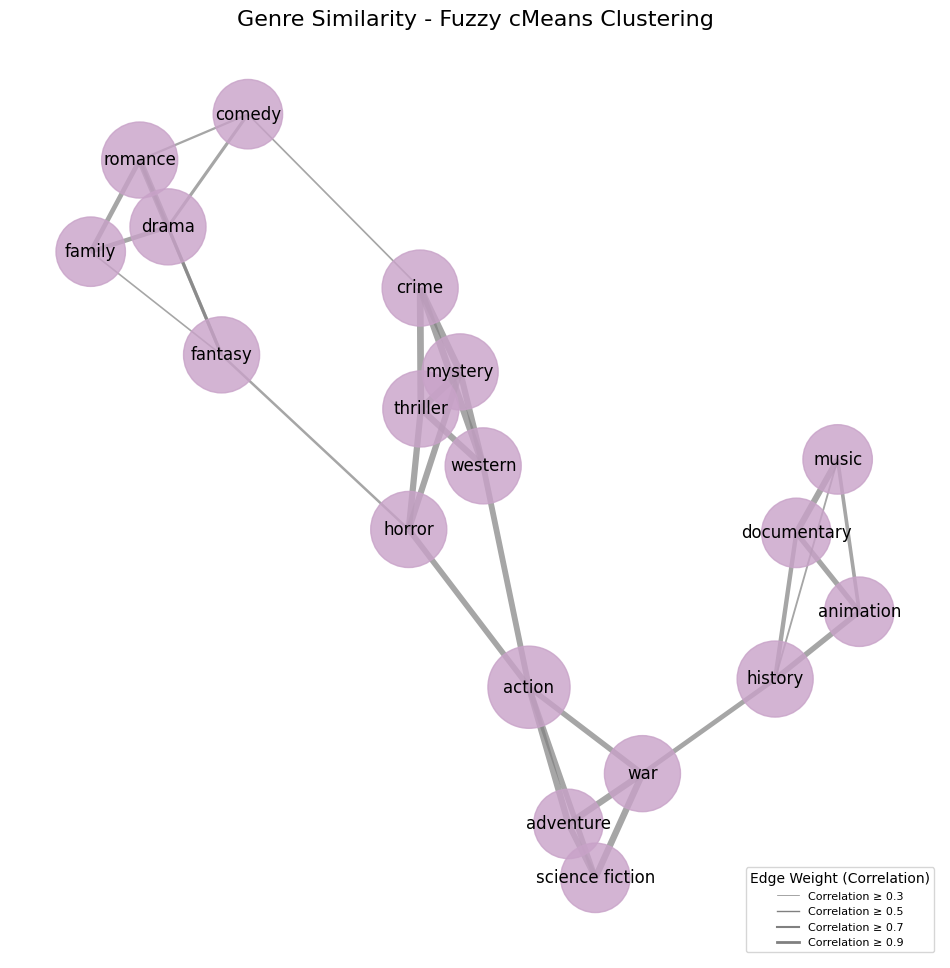

In [ ]:
# Create an empty graph
G_fuzzy = nx.Graph()

# Add nodes and edges from the DataFrame
for _, row in top_correlations_fuzzy_df.iterrows():
    genre = row['Genre']
    correlated_genre = row['Correlated Genre']
    correlation = row['Correlation']

    # Add an edge to the graph with the correlation weight
    G_fuzzy.add_edge(genre, correlated_genre, weight=correlation)

# Node positions in the graph with a customized spring layout
pos_fuzzy = nx.spring_layout(G_fuzzy, seed=42, k=0.3)  # k controls the distance between nodes

# Calculate the degree of each node to size them
node_size_fuzzy = [1000 + 500 * G_fuzzy.degree(n) for n in G_fuzzy.nodes]

# Draw the nodes
plt.figure(figsize=(12, 12))
nx.draw_networkx_nodes(G_fuzzy, pos_fuzzy, node_size=node_size_fuzzy, node_color="#c8a2c8", alpha=0.8)

# Draw the edges with thickness proportional to the weight (correlation)
edges_fuzzy = G_fuzzy.edges(data=True)
nx.draw_networkx_edges(
    G_fuzzy, pos_fuzzy, edgelist=edges_fuzzy,
    width=[d['weight'] * 5 for (_, _, d) in edges_fuzzy],
    edge_color="gray", alpha=0.7
)

# Draw the labels of the nodes
nx.draw_networkx_labels(G_fuzzy, pos_fuzzy, font_size=12, font_color="black")

# Add a legend with edge thickness
legend_labels = [f"{i/10:.1f}" for i in range(3, 10, 2)]
for i, label in enumerate(legend_labels):
    plt.plot([], [], color="gray", linewidth=(i+1)*0.5, label=f"Correlation ≥ {label}")

plt.legend(title="Edge Weight (Correlation)", loc="lower right", fontsize=8)
plt.title("Genre Similarity - Fuzzy cMeans Clustering", fontsize=16)
plt.axis("off")
plt.show()

The results obtained through soft clustering are similar to those of k-means, yet they offer additional nuances that make the groupings more intriguing. Several **distinct genre clusters** emerge, reflecting strong thematic connections, while some genres exhibit **unexpected relationships**, providing new perspectives on their affinities.

One cluster groups **documentary, history, animation, and music**, which is particularly noteworthy. The connection between **documentary and history** is intuitive, as they often share factual or narrative overlap. However, the inclusion of **music**, which is typically isolated, is surprising. Its strong correlation with **documentary**, as indicated by their cluster proximity and shared dense regions, highlights a less obvious but meaningful relationship. **Animation**'s place in this cluster is less straightforward but might stem from overlapping distributions, particularly in clusters like the dense blue region. The connection between **music and animation**, though not immediately intuitive, suggests shared patterns worth exploring further.

Another well-defined cluster includes **history, war, action, adventure, and science fiction**, reflecting clear thematic ties. These genres are often united by narratives involving **conflict** or **exploration**, which makes their grouping logical. The persistence of **war**’s link to **history**, alongside the bridging role of **action** to **adventure and science fiction**, reinforces the coherence of this cluster.

The genres **western, horror, thriller, mystery, and crime** form a separate, cohesive cluster with high internal correlations. This grouping is similar to the one observed in k-means and reflects their shared focus on suspense, tension, and narrative intrigue. These genres naturally complement one another, making their clustering consistent across methods.

Finally, a broader cluster of **drama, romance, family, comedy, and fantasy** emerges. This grouping is distinct from others due to its versatility. These genres frequently appear across various narratives, blending with other genres, which makes their clustering less rigid. **Comedy and family** exhibit subtle connections to **crime and horror**, respectively, but the cluster as a whole captures genres that are **generic and highly adaptable**. **Drama and comedy** remain prominent but less discriminative, reflecting their tendency to span multiple genres.

## **Clustering - Results Comparison**

To compare the clustering results comprehensively, we can **analyze the graphs** generated for each algorithm and calculate key metrics such as **modularity**, **density**, and **clustering coefficient**. These measures will help in assessing the quality of the relationships and groupings within each clustering approach.

### **Modularity (Community Detection)**

One approach to measure how well genres form clusters in the graph is by using `modularity`. Modularity measures the **density of links inside communities** compared to **links between communities**. If the modularity score is **high**, the graph has **clear communities** (clusters of genres). If the score is low, then the graph is more evenly distributed, and there are no clear clusters.

In [ ]:
def modularity_score(G, algorithm):
    # Use community detection (Louvain method or greedy modularity)
    communities = list(greedy_modularity_communities(G))

    # Compute modularity
    modularity_score = modularity(G, communities)

    print("Modularity score", algorithm, ':' , f"{modularity_score:.4f}")

### **Graph Density**

The `density` of the graph can give you a rough idea of **how well-connected the genres are**. If the graph has **high** density (i.e., most genres are connected to each other with high correlation), it suggests there’s **no clear cluster structure**.

The formula for graph density is:

$\text{Density} = \frac{2 \cdot E}{N \cdot (N - 1)}$

Where:
- $E$ is the number of edges (correlations between genres)
- $N$ is the number of nodes (genres)

In [ ]:
# Calculate graph density
def g_density(G, algorithm):
    density = nx.density(G)
    print("Graph Density", algorithm, ':', f"{density:.4f}")

### **Clustering Coefficient**

The `clustering coefficient` quantifies **how close the genres are to forming clusters** by measuring the tendency of genres to form triangles (where three genres are all connected). A **higher** clustering coefficient means **genres tend to cluster together**. A higher value indicates that genres are more tightly grouped together, forming more potential clusters.

In [ ]:
# Calculate clustering coefficient for the entire graph
def clustering_coefficient(G, algorithm):
    clustering_coefficient = nx.average_clustering(G)
    print("Clustering Coefficient", algorithm, ':', f"{clustering_coefficient:.4f}")

### **Final Assessment**

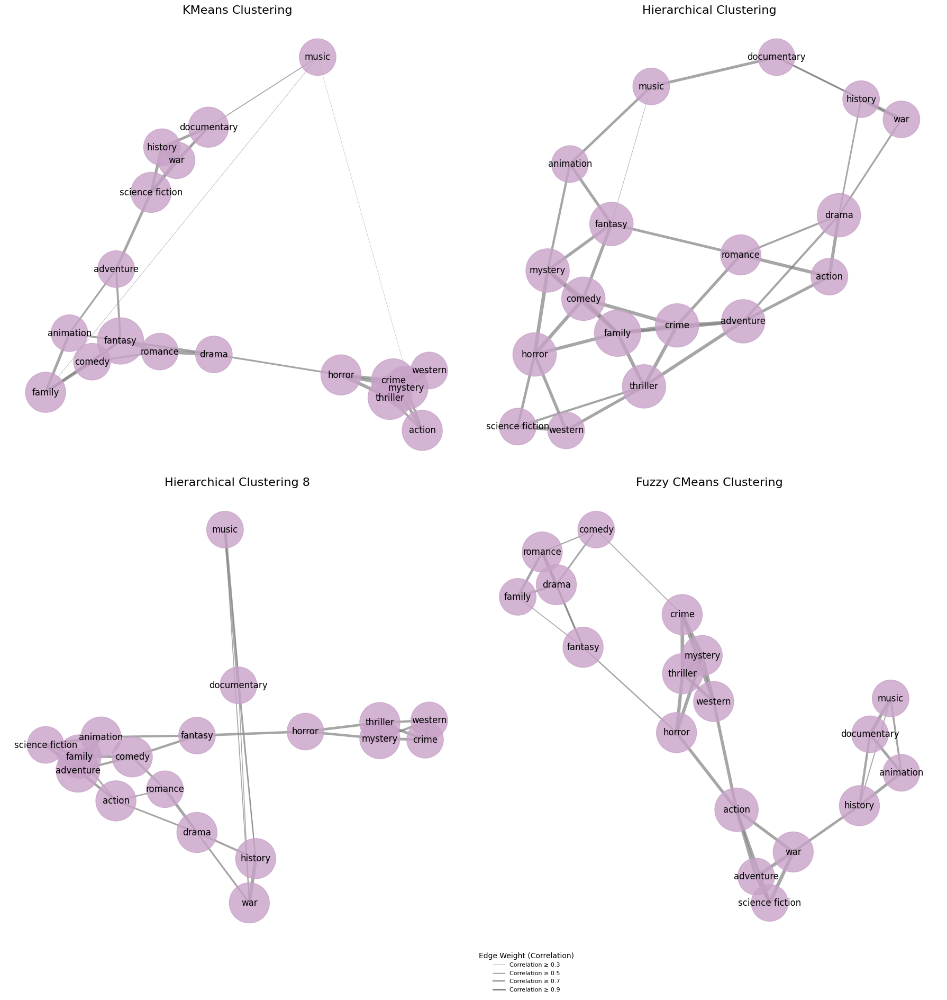

In [ ]:
# Create a figure with 2x2 subplots (4 plots in total)
fig, axs = plt.subplots(2, 2, figsize=(18, 18))

# List of different algorithms
algorithms = ['kmeans', 'hc', 'hc8', 'fuzzy']
graphs = [G_kmeans, G_hc, G_hc8, G_fuzzy]
positions = [pos_kmeans, pos_hc, pos_hc8, pos_fuzzy]
node_sizes = [node_size_kmeans, node_size_hc, node_size_hc8, node_size_fuzzy]
edges_list = [G_kmeans.edges(data=True), G_hc.edges(data=True), G_hc8.edges(data=True), G_fuzzy.edges(data=True)]
titles = ["KMeans Clustering", "Hierarchical Clustering", "Hierarchical Clustering 8", "Fuzzy CMeans Clustering"]

# Loop through the subplots and draw each graph
for i, ax in enumerate(axs.flatten()):
    # Get parameters for each algorithm
    G_ = graphs[i]
    pos_ = positions[i]
    node_size_ = node_sizes[i]
    edges_ = edges_list[i]
    title_ = titles[i]

    # Draw the graph on the current subplot
    nx.draw_networkx_nodes(G_, pos_, node_size=node_size_, node_color="#c8a2c8", alpha=0.8, ax=ax)
    nx.draw_networkx_edges(G_, pos_, edgelist=edges_,
                           width=[d['weight'] * 5 for (_, _, d) in edges_], edge_color="gray", alpha=0.7, ax=ax)
    nx.draw_networkx_labels(G_, pos_, font_size=12, font_color="black", ax=ax)

    # Set title for each subplot
    ax.set_title(title_, fontsize=16)

    # Turn off axis
    ax.axis("off")

# Add a single legend for the entire figure (outside the subplots)
legend_labels = [f"{i/10:.1f}" for i in range(3, 10, 2)]
for i, label in enumerate(legend_labels):
    plt.plot([], [], color="gray", linewidth=(i+1)*0.5, label=f"Correlation ≥ {label}")

fig.legend(title="Edge Weight (Correlation)", loc="lower left", fontsize=8, bbox_to_anchor=(0.5, -0.05), frameon=False)

# Adjust layout to make sure everything fits nicely
plt.tight_layout()
plt.show()

In [ ]:
modularity_score(G_kmeans, 'kmeans')
modularity_score(G_hc, 'hierarchical clustering (4)')
modularity_score(G_hc8, 'hierarchical clustering (8)')
modularity_score(G_fuzzy, 'fuzzy cmeans')

Modularity score kmeans : 0.5792
Modularity score hierarchical clustering (4) : 0.3392
Modularity score hierarchical clustering (8) : 0.5123
Modularity score fuzzy cmeans : 0.5717


In [ ]:
g_density(G_kmeans, 'kmeans')
g_density(G_hc, 'hierarchical clustering (4)')
g_density(G_hc8, 'hierarchical clustering (8)')
g_density(G_fuzzy, 'fuzzy cmeans')

Graph Density kmeans : 0.2222
Graph Density hierarchical clustering (4) : 0.2418
Graph Density hierarchical clustering (8) : 0.2157
Graph Density fuzzy cmeans : 0.2157


In [ ]:
clustering_coefficient(G_kmeans, 'kmeans')
clustering_coefficient(G_hc, 'hierarchical clustering (4)')
clustering_coefficient(G_hc8, 'hierarchical clustering (8)')
clustering_coefficient(G_fuzzy, 'fuzzy cmeans')

Clustering Coefficient kmeans : 0.5796
Clustering Coefficient hierarchical clustering (4) : 0.4722
Clustering Coefficient hierarchical clustering (8) : 0.5926
Clustering Coefficient fuzzy cmeans : 0.6648


The results underscore the effectiveness of **k-means** **fuzzy c-means** and also **hierarchical clustering (8 clusters)** for clustering in this application. These methods achieved **higher modularity** than hierarchical clustering with only 4 clusters, signifying more meaningful and well-defined groupings. However, **fuzzy c-means** emerged as particularly effective due to its **higher clustering coefficient**, reflecting better local connectivity and an enhanced ability to capture nuanced overlaps between genres.

In contrast, **hierarchical clustering** underperformed significantly. The method yielded **lower modularity** and **clustering coefficients**, indicating its struggles to form clear groupings or maintain connectivity within clusters. This result aligns with earlier observations of its inability to clearly separate genres or produce informative clusters. Maybe, the selected number of cluster isn't correct at all: in fact, as it can be seen, a good selection of number of clusters shows improvement.

**Key Observations**

1. **K-Means**:
   - Forms a **closed network structure**, where all genres are interconnected.
   - Groups are robust but show more interconnectivity, which might dilute distinctions between clusters.
   - Simpler implementation makes it practical while still delivering strong performance.

2. **Fuzzy C-Means**:
   - Produces a **linear graph structure**, where extremes are not directly linked, reflecting distinct clusters.
   - Similarity groups are more **compact** and **better separated**, showcasing its advantage in managing overlapping data.
   - Excels in representing the multi-label nature of the data, identifying nuanced relationships.

3. **Hierarchical Clustering (8 clusters)**
   - Produces a **linear graph structure**, where extremes are not directly linked, reflecting distinct clusters.
   - Clusters tend to be **larger and less refined**, often grouping loosely related genres together.
	- Its deterministic nature and ability to preserve the hierarchy of relationships make it suitable for exploring nested genre structures.

These results underscore the **strengths** of **soft clustering** for **complex datasets**.

### **Future Developements**

Focusing specifically on **genre analysis to capture genre similarity**, here are some potential future developments:
- **Contextual Genre Analysis**: Implementing context-aware clustering, where genres are grouped not only by their inherent properties but also by their context within the movie’s narrative or production (e.g., genre co-occurrence in the plot, director style, or audience reception). This could uncover deeper similarities that go beyond basic genre tags.
- **Incorporating Sentiment Analysis**: Incorporate sentiment analysis into genre similarity detection. By analyzing the emotional tones or themes within a movie (using reviews or metadata), it could reveal hidden genre connections based on how movies make audiences feel, rather than just their surface-level categorization.


## **Topic Modeling - Data Cleaning**

In [ ]:
data = pd.read_csv(destination)
data

In [ ]:
# Remove rows with missing data
dataset_topic = data[(data['keywords'].isna() == False) & (data['overview'].isna() == False) & (data['adult'] == False)]

In [ ]:
dataset_topic

,id,title,vote_average,vote_count,status,release_date,revenue,runtime,adult,backdrop_path,...,original_title,overview,popularity,poster_path,tagline,genres,production_companies,production_countries,spoken_languages,keywords
0,27205,Inception,8.364,34495,Released,2010-07-15,825532764,148,False,/8ZTVqvKDQ8emSGUEMjsS4yHAwrp.jpg,...,Inception,"Cobb, a skilled thief who commits corporate es...",83.952,/oYuLEt3zVCKq57qu2F8dT7NIa6f.jpg,Your mind is the scene of the crime.,"Action, Science Fiction, Adventure","Legendary Pictures, Syncopy, Warner Bros. Pict...","United Kingdom, United States of America","English, French, Japanese, Swahili","rescue, mission, dream, airplane, paris, franc..."
1,157336,Interstellar,8.417,32571,Released,2014-11-05,701729206,169,False,/pbrkL804c8yAv3zBZR4QPEafpAR.jpg,...,Interstellar,The adventures of a group of explorers who mak...,140.241,/gEU2QniE6E77NI6lCU6MxlNBvIx.jpg,Mankind was born on Earth. It was never meant ...,"Adventure, Drama, Science Fiction","Legendary Pictures, Syncopy, Lynda Obst Produc...","United Kingdom, United States of America",English,"rescue, future, spacecraft, race against time,..."
2,155,The Dark Knight,8.512,30619,Released,2008-07-16,1004558444,152,False,/nMKdUUepR0i5zn0y1T4CsSB5chy.jpg,...,The Dark Knight,Batman raises the stakes in his war on crime. ...,130.643,/qJ2tW6WMUDux911r6m7haRef0WH.jpg,Welcome to a world without rules.,"Drama, Action, Crime, Thriller","DC Comics, Legendary Pictures, Syncopy, Isobel...","United Kingdom, United States of America","English, Mandarin","joker, sadism, chaos, secret identity, crime f..."
3,19995,Avatar,7.573,29815,Released,2009-12-15,2923706026,162,False,/vL5LR6WdxWPjLPFRLe133jXWsh5.jpg,...,Avatar,"In the 22nd century, a paraplegic Marine is di...",79.932,/kyeqWdyUXW608qlYkRqosgbbJyK.jpg,Enter the world of Pandora.,"Action, Adventure, Fantasy, Science Fiction","Dune Entertainment, Lightstorm Entertainment, ...","United States of America, United Kingdom","English, Spanish","future, society, culture clash, space travel, ..."
4,24428,The Avengers,7.710,29166,Released,2012-04-25,1518815515,143,False,/9BBTo63ANSmhC4e6r62OJFuK2GL.jpg,...,The Avengers,When an unexpected enemy emerges and threatens...,98.082,/RYMX2wcKCBAr24UyPD7xwmjaTn.jpg,Some assembly required.,"Science Fiction, Action, Adventure",Marvel Studios,United States of America,"English, Hindi, Russian","new york city, superhero, shield, based on com..."
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1156404,742913,The Edge,0.000,0,Released,2020-05-05,0,7,False,NaN,...,The Edge,"A lone truck driver drives his load, a ferris ...",0.600,/igKLM7qzAqbPxQgRkLor99BnnPX.jpg,NaN,"Animation, Science Fiction","Ulmi Film, Hochschule Luzern (HSLU), SRF",Switzerland,No Language,"alter ego, desert, truck driver, ferris wheel,..."
1156416,742897,"Jetzt hier, nirgends",0.000,0,Released,2020-06-01,0,3,False,NaN,...,"Jetzt hier, nirgends",A short movie about dreams and the personaliti...,0.600,/6Ctdy8ax0kyOpOc41zlAIIkIKmE.jpg,NaN,Drama,NaN,Switzerland,No Language,"identity, essay film, boxing"
1156418,742896,Promises to the Future,0.000,0,Released,2020-05-30,0,25,False,NaN,...,Promises to the Future,"As the filmmaker pursues a creative career, sh...",0.605,/xezlxCe0EH7hRRSBRBpQp6zksI0.jpg,NaN,Documentary,NaN,NaN,"English, Spanish","art student, documentary filmmaking, creative ..."
1156430,742883,Bats in the Night,0.000,0,Released,2019-10-01,0,15,False,NaN,...,La nuit des chauves-souris,Adri and Beamo are two brothers who like to ha...,0.602,/orpo1xHAtztoGxDEGEm7Z5wGng8.jpg,NaN,Drama,"P.S. Productions, École Cantonale d'Art de Lau...",Switzerland,French,"monster, abandoned house, underage drinking, b..."


In [ ]:
subset_topic = dataset_topic[['title','overview', 'keywords']]
subset_topic.shape

(236847, 3)

In [ ]:
subset_topic = subset_topic.drop_duplicates()
subset_topic.shape

(236768, 3)

In [ ]:
# Filter movies with titles consisting only of alphabetic characters
subset_topic = subset_topic[
    subset_topic['title'].str.contains(r'[a-zA-Z]', na=False)
]

# Remove rows with missing values in 'title' or 'overview'
subset_topic = subset_topic.dropna(subset=['title', 'overview'])


In [ ]:
subset_topic.to_csv("movies_topic.csv", index=False)

## **Topic Modeling Based on Keywords**

In [ ]:
subset_clean = pd.read_csv("movies_topic.csv", sep=',')

In [ ]:
# Function to preprocess keywords
def preprocess_keywords(df):
    df = df.copy()
    df['keywords'] = df['keywords'].fillna('')

    # Function to remove everything inside parentheses (including the parentheses)
    def remove_parentheses(keyword):
        return re.sub(r'\(.*?\)', '', keyword)

    # Apply preprocessing to keywords
    df['keywords_list'] = df['keywords'].apply(lambda x: [remove_parentheses(keyword) for keyword in x.split(', ') if keyword])

    return df

df = preprocess_keywords(subset_clean)

# Create the term matrix
def create_term_matrix(keywords_list):
    documents = [' '.join(keywords) for keywords in keywords_list]
    vectorizer = CountVectorizer(stop_words='english')
    term_matrix = vectorizer.fit_transform(documents)
    feature_names = vectorizer.get_feature_names_out()
    return term_matrix, feature_names

term_matrix, feature_names = create_term_matrix(df['keywords_list'])

# Function to calculate the optimal number of topics
def find_optimal_topics(term_matrix, feature_names, texts, start=2, end=10, step=1):
    scores = []
    perplexities = []
    coherence_scores = []

    # Create a Gensim dictionary from texts
    dictionary = Dictionary(texts)

    for n_topics in range(start, end + 1, step):
        lda_model = LatentDirichletAllocation(n_components=n_topics, random_state=42)
        lda_model.fit(term_matrix)

        # Calculate perplexity
        perplexity = lda_model.perplexity(term_matrix)
        perplexities.append(perplexity)

        # Extract topics as lists of words
        topics = [[feature_names[word_id] for word_id in topic.argsort()[:-10 - 1:-1]]
                  for topic in lda_model.components_]

        # Calculate coherence using `texts` and the Gensim dictionary
        coherence_model = CoherenceModel(topics=topics, texts=texts, dictionary=dictionary, coherence='c_v')
        coherence_score = coherence_model.get_coherence()
        coherence_scores.append(coherence_score)

        # Add the scores
        scores.append((n_topics, perplexity, coherence_score))

    # Find the number of topics with the highest coherence score
    best_n_topics = max(scores, key=lambda x: x[2])[0]
    return best_n_topics, scores, perplexities, coherence_scores

texts = df['keywords_list'].tolist()

# Find the optimal number of topics
optimal_topics, topic_scores, perplexities, coherence_scores = find_optimal_topics(
    term_matrix, feature_names, texts, start=2, end=15
)

print(f"Optimal number of topics: {optimal_topics}")

# Display perplexity and coherence scores for each number of topics
print("\nPerplexity and Coherence scores for each number of topics:")
for n_topics, perplexity, coherence in zip(range(2, 16), perplexities, coherence_scores):
    print(f"Number of Topics: {n_topics} - Perplexity: {perplexity:.4f} - Coherence: {coherence:.4f}")

# LDA model with the optimal number of topics
lda_model = LatentDirichletAllocation(n_components=optimal_topics, random_state=42)
lda_model.fit(term_matrix)

# Display the main topics
def display_topics(model, feature_names, n_top_words=10):
    for idx, topic in enumerate(model.components_):
        print(f"Topic {idx + 1}: ", [feature_names[i] for i in topic.argsort()[:-n_top_words - 1:-1]])

display_topics(lda_model, feature_names)

# Display detailed results for the topics
print("\nDetails of the generated topics:")
for idx, topic in enumerate(lda_model.components_):
    print(f"\nTopic {idx + 1}:")
    top_keywords = [feature_names[i] for i in topic.argsort()[:-10 - 1:-1]]
    print("Main words:", ", ".join(top_keywords))

Optimal number of topics: 7

Perplexity and Coherence scores for each number of topics:
Number of Topics: 2 - Perplexity: 2131.2830 - Coherence: 0.2616
Number of Topics: 3 - Perplexity: 2099.3252 - Coherence: 0.3058
Number of Topics: 4 - Perplexity: 2058.8831 - Coherence: 0.3061
Number of Topics: 5 - Perplexity: 1990.3177 - Coherence: 0.3028
Number of Topics: 6 - Perplexity: 1957.0825 - Coherence: 0.3110
Number of Topics: 7 - Perplexity: 1937.8503 - Coherence: 0.3893
Number of Topics: 8 - Perplexity: 1927.8038 - Coherence: 0.3784
Number of Topics: 9 - Perplexity: 1900.5194 - Coherence: 0.3521
Number of Topics: 10 - Perplexity: 1891.2363 - Coherence: 0.3606
Number of Topics: 11 - Perplexity: 1876.0868 - Coherence: 0.3187
Number of Topics: 12 - Perplexity: 1869.9829 - Coherence: 0.3189
Number of Topics: 13 - Perplexity: 1850.6369 - Coherence: 0.3218
Number of Topics: 14 - Perplexity: 1823.7964 - Coherence: 0.3429
Number of Topics: 15 - Perplexity: 1850.8662 - Coherence: 0.3259
Topic 1:  

In [ ]:
def assign_topics_to_movies(lda_model, term_matrix, df):
    # Calculate the topic distribution
    topic_distribution = lda_model.transform(term_matrix)

    df = df.copy()

    # Find the most probable topic (index and maximum value of the distribution)
    df['topic'] = topic_distribution.argmax(axis=1)
    df['certainty'] = topic_distribution.max(axis=1)

    # Find the second most probable topic
    def second_largest_and_index(row):
        # Sort the values in descending order and find the second one
        sorted_indices = np.argsort(row)[::-1]
        second_index = sorted_indices[1]
        second_value = row[second_index]
        return second_index, second_value

    second_topics_and_scores = np.apply_along_axis(second_largest_and_index, axis=1, arr=topic_distribution)

    df['second_topic'] = second_topics_and_scores[:, 0].astype(int)
    df['second_certainty'] = second_topics_and_scores[:, 1]

    return df

df_with_topics = assign_topics_to_movies(lda_model, term_matrix, df)

# Display the first few rows with the assigned topics
df_with_topics[['title', 'keywords', 'topic', 'certainty', 'second_topic', 'second_certainty']].head()

,title,keywords,topic,certainty,second_topic,second_certainty
0,Inception,"rescue, mission, dream, airplane, paris, franc...",1,0.481753,2,0.353897
1,Interstellar,"rescue, future, spacecraft, race against time,...",3,0.493681,5,0.259464
2,The Dark Knight,"joker, sadism, chaos, secret identity, crime f...",2,0.462978,1,0.303834
3,Avatar,"future, society, culture clash, space travel, ...",1,0.253588,4,0.223278
4,The Avengers,"new york city, superhero, shield, based on com...",5,0.428338,1,0.330458


In [ ]:
df_with_topics_rec = df_with_topics[['title', 'overview', 'topic', 'certainty', 'second_topic', 'second_certainty']]
df_with_topics_rec

,title,overview,topic,certainty,second_topic,second_certainty
0,Inception,"Cobb, a skilled thief who commits corporate es...",1,0.481753,2,0.353897
1,Interstellar,The adventures of a group of explorers who mak...,3,0.493681,5,0.259464
2,The Dark Knight,Batman raises the stakes in his war on crime. ...,2,0.462978,1,0.303834
3,Avatar,"In the 22nd century, a paraplegic Marine is di...",1,0.253588,4,0.223278
4,The Avengers,When an unexpected enemy emerges and threatens...,5,0.428338,1,0.330458
...,...,...,...,...,...,...
235989,The Edge,"A lone truck driver drives his load, a ferris ...",3,0.904601,1,0.015932
235990,"Jetzt hier, nirgends",A short movie about dreams and the personaliti...,5,0.417885,0,0.287408
235991,Promises to the Future,"As the filmmaker pursues a creative career, sh...",0,0.824133,5,0.096347
235992,Bats in the Night,Adri and Beamo are two brothers who like to ha...,3,0.360782,2,0.344939


In [ ]:
df_with_topics_rec.to_csv('movie_for_rec.csv', index=False)

We will calculate the **third quartile** because it will help determine ***whether or not to consider the second topic*** for a given film in the recommendation system.

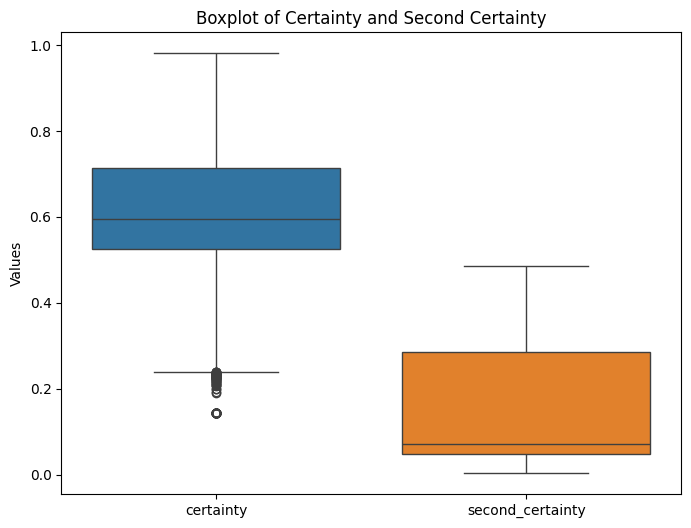

In [ ]:
boxplot_data = df_with_topics_rec[['certainty', 'second_certainty']]

# Boxplot
plt.figure(figsize=(8, 6))
sns.boxplot(data=boxplot_data)
plt.title("Boxplot of Certainty and Second Certainty")
plt.ylabel("Values")
plt.show()


### **Topic Modeling Representation and Comment**

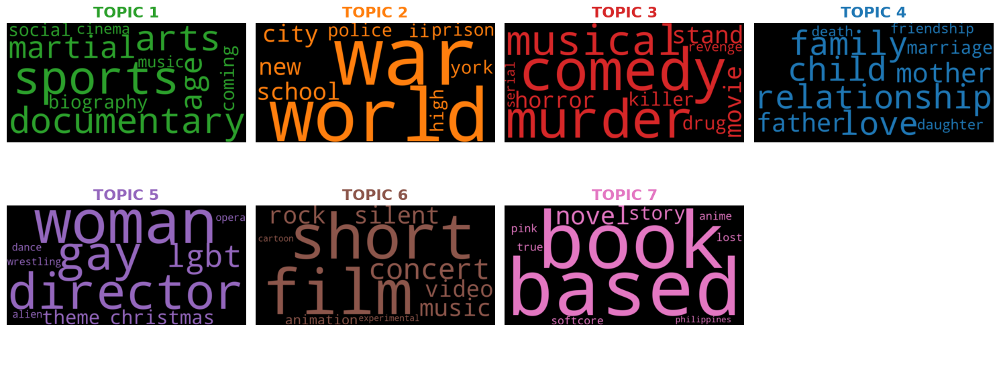

In [ ]:
num_topics = 7
cols = 4
rows = math.ceil(num_topics / cols)

fig, axes = plt.subplots(rows, cols, figsize=(15, rows * 3))
axes = axes.flatten()

# Colors for the topics
custom_colors = [
    '#2ca02c',  # Topic 1: Green
    '#ff7f0e',  # Topic 2: Orange
    '#d62728',  # Topic 3: Red
    '#1f77b4',  # Topic 4: Blue
    '#9467bd',  # Topic 5: Purple
    '#8c564b',  # Topic 6: Brown
    '#e377c2',  # Topic 7: Pink
]

# Function to generate a colored Word Cloud for each topic
def plot_word_cloud(topic_words, topic_idx, ax):
    # Function to return the color for each word
    def color_func(word, font_size, position, orientation, random_state=None, **kwargs):
        return custom_colors[topic_idx]  # Specific color for the topic

    # Create the WordCloud with colors for the current topic
    word_freq = {word: 1 for word in topic_words}  # Each word is unique in a topic
    wordcloud = WordCloud(width=800, height=400, color_func=color_func).generate_from_frequencies(word_freq)

    ax.imshow(wordcloud, interpolation='bilinear')
    ax.axis("off")
    # Add the title in bold and colored
    ax.set_title(f"TOPIC {topic_idx+1}", fontsize=16, fontweight='bold', color=custom_colors[topic_idx])

# Plot the Word Cloud for each topic
for idx, topic in enumerate(lda_model.components_[:num_topics]):
    top_words = [feature_names[i] for i in topic.argsort()[:-11:-1]]
    plot_word_cloud(top_words, idx, axes[idx])

# Turn off the remaining axes (empty slots)
for ax in axes[num_topics:]:
    ax.axis("off")

plt.tight_layout()
plt.show()

In [ ]:
# Function to get movies with probability > 0.9 for each topic
def get_top_movies_by_topic(df_with_topics, n_top=5):
    top_movies_by_topic = {}

    for topic_num in df_with_topics['topic'].unique():
        topic_movies = df_with_topics[
            (df_with_topics['topic'] == topic_num) & (df_with_topics['certainty'] > 0.9)
        ]
        top_movies_by_topic[topic_num] = topic_movies['title'].head(n_top).tolist()

    return top_movies_by_topic

# Function to display the table with filtered movies
def display_colored_table(df_with_topics, n_top=5):
    # Get movies with probability > 0.9
    top_movies_by_topic = get_top_movies_by_topic(df_with_topics, n_top)

    data = []
    for topic_num, movies in top_movies_by_topic.items():
        data.append([f"Topic {topic_num + 1}", ', '.join(movies)])

    topic_df = pd.DataFrame(data, columns=['Topic', 'List of Movies'])

    custom_colors = [
        '#2ca02c',  # Topic 1: Green
        '#ff7f0e',  # Topic 2: Orange
        '#d62728',  # Topic 3: Red
        '#1f77b4',  # Topic 4: Blue
        '#9467bd',  # Topic 5: Purple
        '#8c564b',  # Topic 6: Brown
        '#e377c2',  # Topic 7: Pink
    ]

    # Styling function to color rows based on the topic
    def color_rows(row):
        # Get the color for the topic
        color = custom_colors[row.name % len(custom_colors)]  # Cycle through the palette
        return [
            'background-color: {}; color: white; text-align: center;'.format(color)
        ] * len(row)  # Center align text and set text color to white

    return topic_df.style.apply(color_rows, axis=1)

display_colored_table(df_with_topics, n_top=5)

,Topic,List of Movies
0,Topic 2,"Kingsman: The Golden Circle, Mission: Impossible, Quantum of Solace, Pearl Harbor, The Man from U.N.C.L.E."
1,Topic 4,"Good Will Hunting, About Time, Neighbors, Click, Rain Man"
2,Topic 3,"Pulp Fiction, Don't Breathe, Halloween, A Nightmare on Elm Street, American Pie 2"
3,Topic 6,"Tron, All Star Superman, Saludos Amigos, Ra.One, Break the Silence: The Movie"
4,Topic 7,"Pirates of the Caribbean: Dead Men Tell No Tales, Insurgent, Fifty Shades Darker, Allegiant, How to Train Your Dragon: The Hidden World"
5,Topic 5,"Jupiter Ascending, Planet 51, The Shiny Shrimps, I Am Jonas, The Last Match"
6,Topic 1,"Tooth Fairy, Dr. Dolittle 2, Any Given Sunday, An Inconvenient Truth, Before the Flood"


## **Comments on Film Assignments to Topics**


### **Topic 2**
The films assigned to Topic 2 seem to revolve around action, espionage, and warfare, notably represented by *Kingsman: The Golden Circle* and *Mission: Impossible*. However, while these films share action-packed plots, they fail to capture the broader thematic essence of 'war' or 'police' in a meaningful way, as the narrative focus leans more heavily on individual missions or spy intrigue. *Pearl Harbor*, despite its connection to war, veers more into the romanticized drama category. The connection feels somewhat forced when grouped together.

### **Topic 4**
This topic seems centered around human relationships, love, and family. Films like *Good Will Hunting* and *Rain Man* dive deep into personal development, while *About Time* explores love and the passage of time. However, *Neighbors* and *Click* feel slightly out of place. *Neighbors*, as a comedy, doesn't strongly tie to the emotional depth that defines 'relationship' and 'family' themes. Likewise, *Click*, though touching, doesn't maintain a consistent focus on family and relationships in a grounded sense.

### **Topic 3**
Topic 3 aligns well with horror and comedy, as seen in films like *Pulp Fiction*, *Halloween*, and *A Nightmare on Elm Street*. The topic seems to capture films with mixed tones—horror intertwined with dark humor or satirical elements, although the inclusion of *American Pie 2* feels somewhat disconnected. It leans more towards teen comedy than a serious exploration of murder, revenge, or serial killer themes. A better fit would have been more intense horror films or dark comedies.

### **Topic 6**
Films in Topic 6, including *Tron* and *All Star Superman*, suggest a heavy emphasis on animation, experimental filmmaking, and music-based visuals. While *Ra.One* and *Saludos Amigos* do feature elements of animation and spectacle, the assignment of these films to this topic is partially misguided. *Break the Silence: The Movie* doesn't feel connected to the theme of experimental cinema and animation, as it focuses more on music and performance.

### **Topic 7**
Films in Topic 7 are mainly adaptations of books or based on true stories, but the connection between the films feels stretched. While *Pirates of the Caribbean: Dead Men Tell No Tales* and *How to Train Your Dragon: The Hidden World* fit into the 'based on a book' category, others like *Insurgent* and *Fifty Shades Darker* focus more on fantasy and romance than on the themes of novels or true stories. The inclusion of 'pink' and 'softcore' themes feels off-target.

### **Topic 5**
Topic 5 seems to be about LGBT themes, but some of the films assigned, like *Jupiter Ascending* and *Planet 51*, are only loosely related to the theme. While *The Shiny Shrimps* and *I Am Jonas* are more fitting, the broader connection with films about aliens, Christmas, or wrestling feels tenuous. The diversity of themes makes it difficult to establish a coherent overall narrative or perspective in this topic.

### **Topic 1**
Topic 1 is supposed to center around sports, documentaries, and arts, but many of the assigned films feel disconnected from these themes. While *Any Given Sunday* touches on sports, the inclusion of *Tooth Fairy* and *Dr. Dolittle 2* is puzzling as they lack substantial thematic depth in the areas of sports or documentary. Films like *An Inconvenient Truth* and *Before the Flood* are more aligned with environmental activism, but they don’t quite fit into the ‘arts’ or ‘sports’ categories.


## **Recommendation System**

## How the `recommend_movies` Function Works

The `recommend_movies` function suggests similar movies based on **text similarity** and **topic-based weighting**, with topic relevance determined by quartiles of the certainty scores.

---

### Steps:
1. **Input Processing**: The movie title is cleaned and matched with the dataset.
2. **Feature Extraction**: Primary and secondary topics are extracted, and their certainty values are compared to quartiles.
3. **Cosine Similarity**: Measures textual similarity between the input movie’s overview and others.
4. **Topic Weighting**: If topics are deemed relevant (based on certainty quartiles), they boost similarity scores.
5. **Ranking**: Movies are ranked based on adjusted similarity, considering topic relevance.

---

### Features:
- Combines **textual** and **thematic** similarity.
- **Topic relevance** is based on quartiles of certainty scores.
- Customizable with `top_n` and `topic_weight`.

In [ ]:
import pandas as pd
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.metrics.pairwise import cosine_similarity

df = pd.read_csv('movie_for_rec.csv', sep=',')

# Preprocessing of titles and overviews
def preprocess_data(df):
    # Convert titles to lowercase and replace spaces with underscores
    df['clean_title'] = df['title'].str.lower().str.replace(r'\s+', '_', regex=True)
    return df

df = preprocess_data(df)

# Vectorization of overviews
vectorizer = TfidfVectorizer(stop_words='english')
tfidf_matrix = vectorizer.fit_transform(df['overview'])

# Calculate quartiles for certainty and second_certainty
QF = df['certainty'].quantile([0.25, 0.5, 0.75]).to_dict()
QS = df['second_certainty'].quantile([0.25, 0.5, 0.75]).to_dict()

# Function to determine the decision on topics
def decide_topics(certainty, second_certainty):
    if certainty >= QF[0.75]:  # First dominant topic
        return "first_only"
    elif QF[0.25] <= certainty < QF[0.75]:  # Moderately relevant first topic
        if second_certainty >= QS[0.75]:  # Relevant second topic
            return "both"
        else:  # Non-relevant second topic
            return "first_only_moderate"
    elif certainty < QF[0.25]:  # Weak first topic
        return "none"

# Function to apply weights based on the topic decision
def apply_topic_weight(cosine_sim, idx, input_topic, second_topic, topic_decision, topic_weight):
    topic_similarity = (df['topic'] == input_topic).astype(int)
    second_topic_similarity = (df['topic'] == second_topic).astype(int)
    movie_certainty = df['certainty'].apply(lambda x: x if x >= QF[0.25] else 0)
    movie_second_certainty = df['second_certainty'].apply(lambda x: x if x >= QS[0.25] else 0)


    if topic_decision == "none":
        return cosine_sim
    elif topic_decision == "first_only":
        return cosine_sim * (1 + topic_weight * topic_similarity * movie_certainty)
    elif topic_decision == "both":
        return cosine_sim * (
            1 + topic_weight * (topic_similarity * movie_certainty + second_topic_similarity * movie_second_certainty))
    elif topic_decision == "first_only_moderate":
        return cosine_sim * (1 + topic_weight * topic_similarity * movie_certainty)
    else:
        return cosine_sim  # Default case

# Updated recommendation system
def recommend_movies(input_title, df, tfidf_matrix, top_n=3, topic_weight=2):
    input_title_clean = input_title.lower().replace(' ', '_')

    if input_title_clean not in df['clean_title'].values:
        return f"The title '{input_title}' is not present in the dataset."

    idx = df[df['clean_title'] == input_title_clean].index[0]
    input_title_original = df.loc[idx, 'title']
    input_overview = df.loc[idx, 'overview']
    input_topic = df.loc[idx, 'topic']
    input_certainty = df.loc[idx, 'certainty']
    second_topic = df.loc[idx, 'second_topic']
    second_certainty = df.loc[idx, 'second_certainty']

    # Determine the decision on topics
    topic_decision = decide_topics(input_certainty, second_certainty)
    print(f"Topic decision for '{input_title}': {topic_decision}")

    # Calculate cosine similarity
    cosine_sim = cosine_similarity(tfidf_matrix[idx], tfidf_matrix).flatten()

    # Apply weights based on the topic decision
    weighted_cosine_sim = apply_topic_weight(
        cosine_sim, idx, input_topic, second_topic, topic_decision, topic_weight)

    # Find the top_n movies with the highest similarity (excluding itself)
    similar_indices = weighted_cosine_sim.argsort()[-(top_n+1):-1][::-1]
    recommended_movies = df.iloc[similar_indices][['title', 'overview', 'topic']].copy()

    # Add input movie information
    print(f"Input movie:\n- Title: {input_title_original}\n- Overview: {input_overview}\n- Topic: {input_topic}")

    return recommended_movies[['title', 'overview', 'topic']]

# Test the function
input_title = "Insurgent"
recommendations = recommend_movies(input_title, df, tfidf_matrix, top_n=3)
print(f"\nRecommended movies for '{input_title}':")
recommendations

Topic decision for 'Insurgent': first_only
Input movie:
- Title: Insurgent
- Overview: Beatrice Prior must confront her inner demons and continue her fight against a powerful alliance which threatens to tear her society apart.
- Topic: 6

Recommended movies for 'Insurgent':


,title,overview,topic
601,Allegiant,Beatrice Prior and Tobias Eaton venture into t...,6
199115,Babangluksa,One year after the violent death of Carlos'; (...,6
16202,The Seven Deadly Sins: Grudge of Edinburgh Part 2,Reunited with Lancelot for the first time sinc...,6


In [ ]:
recommendations.to_csv('rec.csv', index = False)

## **Check without Topic**

In [ ]:
df = pd.read_csv('movie_for_rec.csv', sep=',')

# Preprocessing of titles and overviews
def preprocess_data(df):
    # Convert titles to lowercase and replace spaces with underscores
    df['clean_title'] = df['title'].str.lower().str.replace(r'\s+', '_', regex=True)
    return df

df = preprocess_data(df)

vectorizer = TfidfVectorizer(stop_words='english')
tfidf_matrix = vectorizer.fit_transform(df['overview'])

# Recommendation system using cosine similarity between overviews
def recommend_movies(input_title, df, tfidf_matrix, top_n=3):
    input_title_clean = input_title.lower().replace(' ', '_')

    if input_title_clean not in df['clean_title'].values:
        return f"The title '{input_title}' is not present in the dataset."

    idx = df[df['clean_title'] == input_title_clean].index[0]

    input_title_original = df.loc[idx, 'title']
    input_overview = df.loc[idx, 'overview']
    input_topic = df.loc[idx, 'topic']

    # Compute cosine similarity between overviews
    cosine_sim = cosine_similarity(tfidf_matrix[idx], tfidf_matrix).flatten()

    # Find the top_n movies with the highest similarity (excluding itself)
    similar_indices = cosine_sim.argsort()[-(top_n+1):-1][::-1]

    recommended_movies = df.iloc[similar_indices][['title', 'overview', 'topic']]

    print(f"Input movie:\n- Title: {input_title_original}\n- Overview: {input_overview}\n- Topic: {input_topic}")

    return recommended_movies

# Test the function
input_title = "Insurgent"
recommendations_old = recommend_movies(input_title, df, tfidf_matrix, top_n=3)
print(f"\nRecommended movies for '{input_title}':")
recommendations_old

Input movie:
- Title: Insurgent
- Overview: Beatrice Prior must confront her inner demons and continue her fight against a powerful alliance which threatens to tear her society apart.
- Topic: 6

Recommended movies for 'Insurgent':


,title,overview,topic
223697,Antagonist,A story about a girl and her inner demons.,3
176210,Geißel der Menschheit,Venereal disease threatens to tear a young cou...,3
59112,Laura's Wedding,When love blossoms between a young Italian wom...,3


In [ ]:
recommendations_old.to_csv('rec_old.csv', index = False)

### Comparing Recommendations for "Insurgent"

#### 1. Recommendations Without Topic Consideration
Using the dataset where only overview similarity was considered, the recommendations are:
- **Antagonist**: A story about a girl and her inner demons.
- **Geißel der Menschheit**: Venereal disease threatens to tear a young couple apart.
- **Laura's Wedding**: When love blossoms between a young Italian woman and an African student, her family’s disapproval — and a secret — threatens to tear the lovers apart.

All recommended movies belong to **Topic 3**, which is unrelated to the input movie's topic (Topic 6). This indicates a lack of thematic alignment.

---

#### 2. Recommendations with Topic Consideration
Using the dataset where topics were incorporated into the recommendation system, the results are:
- **The Golden Dog**: When two old prospectors find gold dust in the fur of their Airedale, they dream of big riches. But soon, greed threatens to tear them apart until a ghost reminds them of the value of friendship.
- **Allegiant**: Beatrice Prior and Tobias Eaton venture into the world outside of the fence and are taken into protective custody by a mysterious agency known as the Bureau of Genetic Welfare.
- **Babangluksa**: One year after the violent death of Carlos' girlfriend Beatrice, his current love, Anna, starts experiencing supernatural events. Fearing for her safety, Anna believes Beatrice's ghost is haunting her.

All recommended movies belong to **Topic 6**, ensuring thematic alignment with the input movie.

---

#### Analysis
1. **Recommendations Without Topics**:
   - The suggestions focus on textual similarity in the overview, leading to some overlap in tone (e.g., "inner demons") but failing to align with the input movie's topic.
   - Topic mismatch results in movies that might not appeal to users seeking thematic relevance.

2. **Recommendations with Topics**:
   - Incorporating topic alignment ensures that the suggested movies share a thematic connection with "Insurgent."
   - For instance, *Allegiant* directly ties into the same franchise, while *The Golden Dog* and *Babangluksa* explore themes of conflict and resolution that align with the input movie's narrative style.

## **Failed Attempts**

### Topic Modeling - Attempt with Attached Keywords: Why It Fails

Attaching specific keywords like "narcotics detective," "buddy detective duo," or "private detective" seems effective for extracting topics, but it falls short for several reasons:

1. **Lack of Generalization**:
   - Narrow keyword focus limits the system's ability to capture broader thematic connections. For example, both "narcotics detective" and "private detective" belong to the crime-solving theme but are treated separately.
   - The term "buddy detective duo" emphasizes a specific relationship but overlooks broader genre overlaps.

2. **Missed Connections**:
   - Movies with similar themes, like investigations or partnerships, may not be grouped together due to overemphasis on specific keywords. For instance, a film about an undercover agent in a drug cartel might not connect with a movie about a corporate detective, despite shared investigative elements.


## **References**
**Networkx Library**: https://networkx.org/documentation/stable/tutorial.html

**Community subpackage**: https://networkx.org/documentation/stable/reference/algorithms/community.html

**Density Function**: https://networkx.org/documentation/stable/reference/generated/networkx.classes.function.density.html

**Average Clustering**: https://networkx.org/documentation/stable/reference/algorithms/generated/networkx.algorithms.cluster.
average_clustering.html

**Fuzzy c-means**: https://pythonhosted.org/scikit-fuzzy/auto_examples/plot_cmeans.html

**Kneed Locator**: https://pypi.org/project/kneed/

**Dendogram**: https://docs.scipy.org/doc/scipy/reference/generated/scipy.cluster.hierarchy.dendrogram.html

**Hierarchical Clustering**: https://docs.scipy.org/doc/scipy/reference/generated/scipy.cluster.hierarchy.linkage.html

**ARI Score**: https://scikit-learn.org/1.5/modules/generated/sklearn.metrics.adjusted_rand_score.html

**Silhouette Score**: https://scikit-learn.org/1.5/modules/generated/sklearn.metrics.silhouette_score.html

**Davied Bouldin Score**: https://scikit-learn.org/dev/modules/generated/sklearn.metrics.davies_bouldin_score.html

**KMeans**: https://scikit-learn.org/1.5/modules/generated/sklearn.cluster.KMeans.html

**TSNE**: https://scikit-learn.org/1.5/modules/generated/sklearn.manifold.TSNE.html

**Sentence Transformer**: https://huggingface.co/sentence-transformers/all-MiniLM-L6-v2

**TMDb Movie Dataset**: https://www.kaggle.com/datasets/asaniczka/tmdb-movies-dataset-2023-930k-movies/data